# Set up and Config

In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns
import anndata as ad
import PyPDF2
import matplotlib.pyplot as plt
import statistics as st
from pathlib import Path
import scipy.stats as stats
from collections import defaultdict
from statannot import add_stat_annotation



#Adata Files
adata_processed = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/adata_processed__02172022.h5ad"
adata = sc.read_h5ad(adata_processed)

adata_tissue = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/adata_thymus_processed_02172022.h5ad"
tissue = sc.read_h5ad(adata_tissue)

tissue_sg_path = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tissue_sg1_02172022.h5ad"
tissue_sg1 = sc.read_h5ad(tissue_sg_path)

sc.settings.verbosity = 3             
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.1 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.8 pynndescent==0.5.5


# Clustering

In [2]:
#adata_thymus = adata[adata.obs['tissue'] == "Thymus"].copy()
#sc.pp.pca(adata_thymus)
#sc.pp.neighbors(adata_thymus, n_pcs=9)
#sc.tl.leiden(adata_thymus) 
#sc.tl.umap(adata_thymus)

In [3]:
#adata_thymus_processed = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/adata_thymus_processed_02172022.h5ad"
#adata_thymus.write(adata_thymus_processed)

# Clustering consistancy

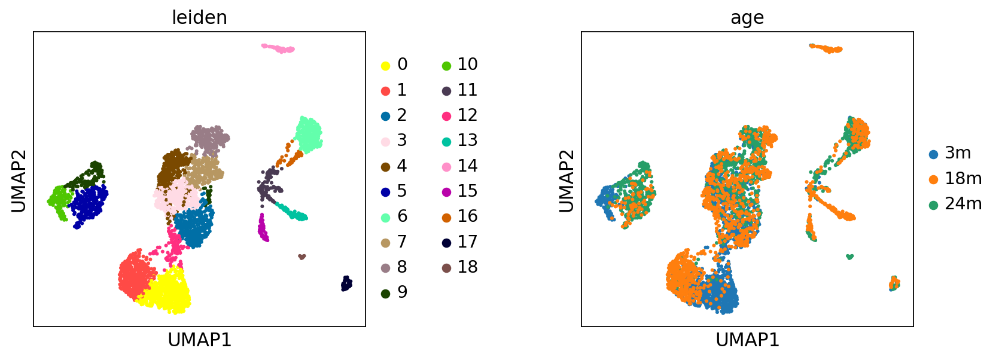

In [4]:
sc.pl.umap(tissue, color = ['leiden', 'age'], wspace=.5)

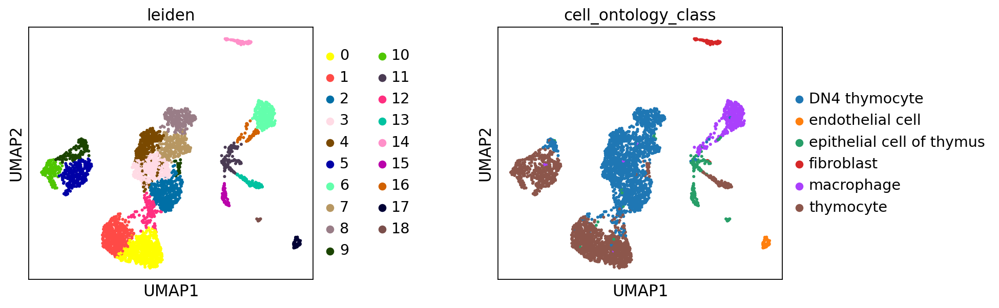

In [5]:
sc.pl.umap(tissue, color = ['leiden', 'cell_ontology_class'], wspace= 0.5)

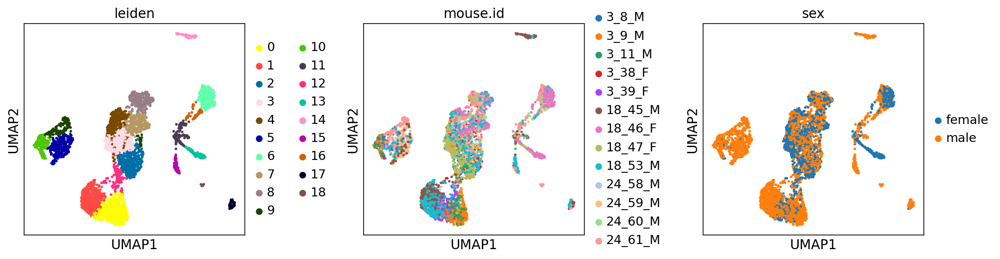

In [6]:
sc.pl.umap(tissue, color = ['leiden', 'mouse.id', 'sex'], wspace= 0.4)

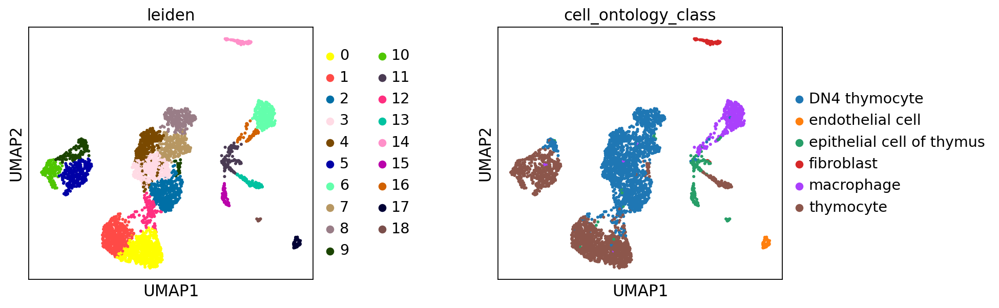

In [7]:
sc.pl.umap(tissue, color = ['leiden', 'cell_ontology_class'], wspace= 0.5)

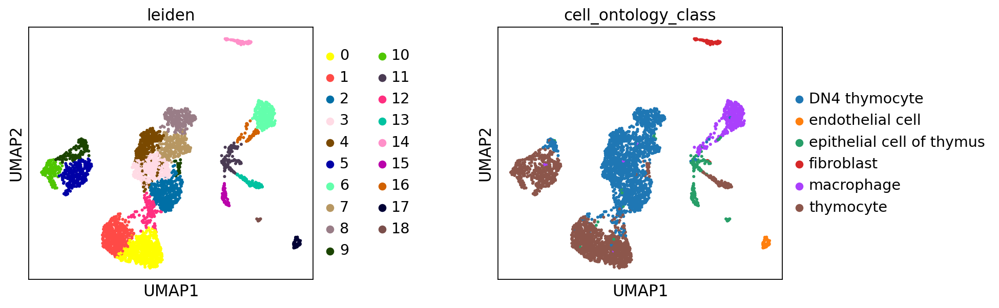

In [8]:
sc.pl.umap(tissue, color = ['leiden', 'cell_ontology_class'], wspace= 0.5)

## Gene umaps

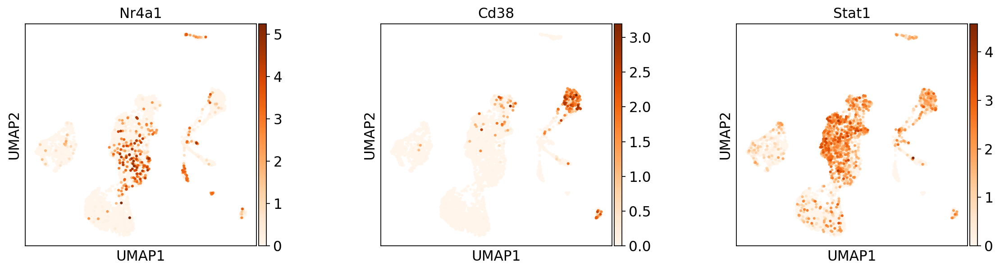

In [9]:
#macrophage assc.genes
sc.pl.umap(tissue, color = ['Nr4a1','Cd38', 'Stat1'], color_map= 'Oranges', wspace= 0.4)

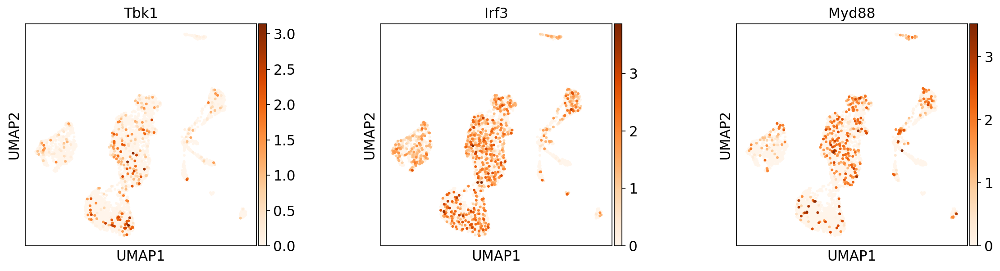

In [10]:
sc.pl.umap(tissue, color = ['Tbk1', 'Irf3','Myd88'], color_map= 'Oranges', wspace= 0.4)

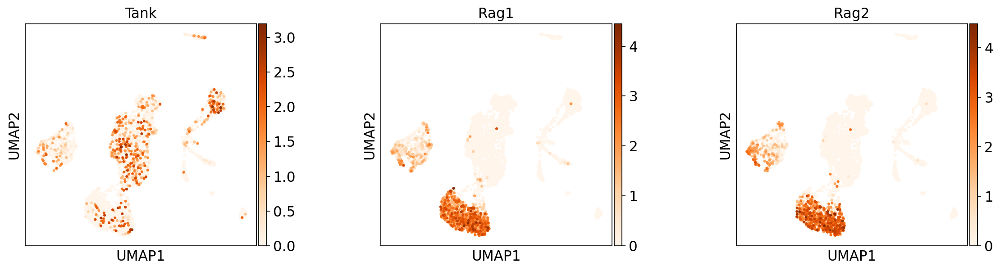

In [11]:
sc.pl.umap(tissue, color = ['Tank','Rag1', 'Rag2'], color_map= 'Oranges', wspace= 0.4)

# Lists

In [12]:
mitocarta3_path = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/Mouse_mt_genes.csv"
mitocarta3_df = pd.read_csv(mitocarta3_path)
mt_nc_genes = list(mitocarta3_df['Symbol'])

mitocarta_remove = ["mt-Atp6",
                    "mt-Atp8",
                    "mt-Co1",
                    "mt-Co2",
                    "mt-Co3",
                    "mt-Cytb",
                    "mt-Nd1",
                    "mt-Nd2",
                    "mt-Nd3",
                    "mt-Nd4",
                    "mt-Nd4l",
                    "mt-Nd5",
                    "mt-Nd6"]

#removing mt_encoded genes
for m in mitocarta_remove:
    mt_nc_genes.remove(m)

In [13]:
mt_genes = [
    "mt-Atp6",
    "mt-Atp8",
    "mt-Co1",
    "mt-Co2",
    "mt-Co3",
    "mt-Cytb",
    "mt-Nd1",
    "mt-Nd2",
    "mt-Nd3",
    "mt-Nd4",
    "mt-Nd4l",
    "mt-Nd5",
    "mt-Nd6",
    "mt-Rnr1",
    "mt-Rnr2",
    "mt-Ta",
    "mt-Te",
    "mt-Tf",
    "mt-Ti",
    "mt-Tl1",
     "mt-Tl2",
    "mt-Tm",
    "mt-Tp",
    "mt-Tq",
    "mt-Tt",
    "mt-Tv"
]

Genes not in adata.vars

In [14]:
#sc.tl.score_genes_cell_cycle ignored these genes since they're not in .vars
ignored = ['Gatd3a', 'Micos10', 'Fdx2', 'Mmut', 'Atp5pb', 'Mtarc2', 'Micos13', 'Mtres1', 'Coa8', 'Tmlhe', 'Mtarc1', 'Prxl2a', 'Marchf5', 'Dmac2l', 'Atp5md', 'Antkmt', 'Atpsckmt', 'Septin4', 'Prorp', 'Htd2', 'Pigbos1']


Mitocarta3.0 nuclear genes combined with mitochondrial genes

In [15]:
mt_nc = mt_genes + mt_nc_genes

In [16]:
tis_cells = list(set(tissue.obs['cell_ontology_class']))
ages = ['3m','18m','24m']

## Macrophage gene lists

Macrophage Polarization: Different Gene Signatures in M1(LPS+) vs. Classically and M2(LPS–) vs. Alternatively Activated Macrophages
Marco Orecchioni et al. 2019.

https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6543837/#SM5

In [17]:
#Only in vivo M1(=LPS+) UPREG
genes1 = ['Irg1','Ccl2','Csf2','Marcksl1','Il23a','Cmpk2','Rtp4','Slc7a11','Maff','Gpr85','Pde4b','Trex1','Ier3','Ifi47','Nfkbie','Oasl2','Gdf15','Cdkn1a','Slc7a2','Gem','F10','Oas2','Il15','Rnd3','Gbp2','Lif','Irf1','Fabp3','Src','Slc39a14','Ccl9','Ripk2','Plagl1','Iigp1','Rel','Tap1','Sphk1','Stat5a','Sh3bp5','Lad1','Adm','Lcp2','Zc3h12a','Calcrl','Irgm1','Arid5a','Arrdc4','Cebpd','Junb','Etv6','Stk40','Nfkb1','Daxx','E2f8','Tlr7','Fam129a','Tmem2','Znfx1','Cav1','Mmp13','Plek','Trib3','Herpud1','Asns','Tgm2','Klf7','Ptprj','Ccdc86','Slc1a4','Nmi','Tpst1','Hk2','Osgin2','Slamf9','Egr1','Akna','Atp10a','Phldb1','Sesn2','Rbpj','Mthfd2','Parp12','Aff1','Slc12a4','Tor3a','Ogfr','Kpna3','Plagl2','Casp7','Ugcg','N4bp1','Igsf8','Rasa2','Tank','Rcsd1','Trim13','Marcks','Siah2','Hivep1','Rbbp8','Tnfaip2','Tcof1','Myd88','Apbb1ip','Dab2','Psmb10','Stip1','Sp100','Myo10','Psme2','Mtmr14','Plaur','Il2rg','Aftph','Tars','Appl1','Myo1g','Dck','Sap30','Fcgr2b','Sertad2','Rabgef1','Azi2','Rnf19b','Nck1','Vav3','Trim34','Itgav','Prdm1','Aebp2','Larp1','Eef1e1','Ifitm3','Rela','Aars','Epsti1','Slc4a7','Rps6ka2','Rnf14','Gars','Tor1aip1','Katna1','Ddx21','Eif2s2','Nampt','Zfand3','Wars','Wdr43','Aida','Ube2f','Rps6ka4','Ptpn2','Sbds','Notch2','Nup62','Txnrd1','Top1','Eif6','Klf6','Gtpbp2','Lztfl1','Hspa9','Mat2a','Abca1','Ptpn12','Surf4','B3gnt2','Ghitm','Gtf2b','Slc3a2','Bcl10','Srgn','Sqstm1','Atf4','Tapbp','Eif3c','Hspa5']
M1 = []
for i in genes1:
    if i in list(tissue.var.index):
        M1.append(i)
    



In [18]:
#Only in vivo M2(+LPS-) UPREG
genes2 = ['Fbxo32','Cebpa','Gadd45g','N4bp2l1','Tns1','Lpin1','Mnt','Rgs2','Gprc5b','Rassf3','Rasa3','Ypel3','Mknk2','Pparg','Tpcn1','Pdcd4','Arhgap18','Dnmt1','Gmnn','Rapgef6','Idh1','Klc4','Mxi1','Dennd4c','H2afv','St6gal1','Ldlrap1','Mef2d','Sgsh','Pcmtd2','Inpp5d','Ift74','Nfic','Fbxl20','Nbr1','Tsc22d3','Zdhhc14','Zrsr1','Appl2','Dio2','Cbr3','Ulk1','Pcyox1','Rab11fip5','AU020206','Cdadc1','Hmha1','Dag1','B3gnt8','Abtb1','Tbl1xr1','Mtss1','Rbl2','Gnpda1','Hdac5','Parp1','Hscb','Paip2','Ctdsp2','Fbxo8','Cnot6l','C3ar1','Hip1','Erp29','Tmem71','Mkl1','Dhcr7','Hacl1','Dgkz','Cnnm3','Sash3','Nr1d2','Ptpn22','Tmem51','Gtf2i','Cdt1','Slc29a3','Glul','0610009B22Rik','Nfam1','Acadm','Siva1','Dguok','Rmnd5a','Zfp36l2','Wdr26','Cbx3','Arhgap9','Cpt1a','Selplg','Tspan14','Hmgcl','Usf2','Slc48a1','Mfsd6','Pla2g15','Adcy7','Numa1','Coro1c','Rgl2','Rab40c','Itgb5','Thap11','Pctp','Tec','Hsd3b7','Gabarapl1','Cdk2ap2','Abhd4','Fam63a','Cd300a','Snap47','Pcyt1a','Rab31','Mbp','Bnip3l','Ivns1abp','Hbp1','Ppp3ca','Pnpla2','Snapin','Lat2','Ip6k1','Rfc2','Kif3a','Sec14l1','Xpr1','Zfand2a','Slc6a8','Pnpla7','Klhdc2','Oxct1','Clip1','Timp2','Maf1','Echs1','Map1lc3b','Ppp2r5c','Hadhb','Ncf2','Cd151','Polr2e','Osbpl9','Ralbp1','1810058I24Rik','Paics','Snx5','Hadh','Fam134b','2900097C17Rik','Hp1bp3','Dusp3','Rnf128','Elp2','Asnsd1','Large','Atxn10','Abhd12','Dap','Soat1','Lipa','Bach1','Vamp4','Rnh1','Cd84','Crip1','Gusb','Gltp','Ctnnb1','Pla2g6','Tmub1','B4galnt1','Arhgap12']
M2 = []
for i in genes2:
    if i in list(tissue.var.index):
        M2.append(i)


In [19]:
M = M1 + M2

In [20]:
M1_short = ['Junb','Cebpd','Cav1','Herpud1','Tgm2','Egr1','Il2rg','Dck','Ifitm3','Srgn','Sqstm1','Atf4','Tapbp','Hspa5']

M2_short = ['Tns1','Ypel3','Pdcd4','Dnmt1','Gmnn','Rapgef6','Mxi1','H2afv','Nfic','Tsc22d3','AU020206','Dag1','Parp1','Paip2','Erp29','Sash3','Ptpn22','Siva1','Rmnd5a','Selplg','Cdk2ap2','Timp2','Map1lc3b','Ppp2r5c','Cd151','Dusp3','Vamp4','Crip1','Gltp','Ctnnb1','B4galnt1']


In [21]:
#Only in vivo M1(=LPS+) DOWNREG
genes3 = ['Irg1','Cd40','Ptgs2','Ccl2','Csf2','Marcksl1','Il12a','Il12b','Icam1','Ifit2','Il23a','Vcam1','Rsad2','Cmpk2','Gpr84','Nfkbiz','Rtp4','Ehd1','Traf1','Ccnd2','Socs3','Adora2a','Slc7a11','Maff','Cish','Ccl7','Ccl22','Serpine1','Serpinb2','Slfn1','Cd38','Inhba','Edn1','Csf1','Lcn2','Mefv','Aqp9','Gpr85','Nfkb2','Pde4b','Hbegf','Trex1','AW112010','Il15ra','Ier3','Ifi47','Nfkbie','Oasl2','Irf7','Zbp1','Pilra','Oas3','Gdf15','Ifih1','Slco3a1','Nfkbia','Met','Sdc4','Cdkn1a','Slc7a2','Gem','F10','Isg20','Stat2','Il15','Rnd3','Batf2','Gbp2','Tlr2','Lif','Chac1','Irf1','Fabp3','Src','Cflar','Slc39a14','Ccl9','Ripk2','Spred1','Plagl1','Iigp1','Rel','Hdc','Nupr1','Igtp','Tap1','Gas7','Mmp14','Dhx58','Agrn','Sphk1','Vcan','Stat5a','Ccl17','Ifi35','Jak2','Sh3bp5','Arg2','Gch1','Ch25h','Lad1','Peli1','Adm','Ddx60','Vasp','Lcp2','Zc3h12a','Zufsp','Calcrl','Irgm1','Eif2ak2','Arid5a','Arrdc4','Sod2','Cd274','Ell2','Cd83','Ptges','Cebpd','Junb','Etv6','Stk40','Nfkb1','Daxx','E2f8','Pvr','Tlr7','Batf','Cxcl9','Slc25a37','Ms4a6c','Pstpip2','Ccl24','Fam129a','Tmem2','Itgal','Parp9','Znfx1','Cav1','Mmp13','A630072M18Rik','Plek','Notch1','Hck','Trib3','Herpud1','Asns','Snx20','Tgm2','Nfkbib','Klf7','Ptprj','Ccdc86','Slc1a4','Nmi','Tpst1','Ccrl2','Samsn1','Dusp2','Cd14','Hk2','Cxcl16','Slfn2','Ddhd1','Jdp2','Shmt2','Osgin2','Tapbpl','Slamf9','Egr1','Akna','Stat1','Atp10a','Phldb1','Sesn2','Rbpj','Mthfd2','Parp12','Rbpms','Aff1','Socs2','Rab32','Map3k5','Slc12a4','Il1rn','Tor3a','Flnb','Ogfr','Kpna3','Birc3','Tap2','Mitd1','Rcn1','Plagl2','Casp7','Ugcg','N4bp1','Igsf8','Rasa2','Tank','Ggct','Tnip1','Rcsd1','Rrs1','Cd86','Trim13','Irf9','Il17ra','Marcks','Siah2','Hivep1','Rbbp8','Trim25','Tnfaip2','Lmo4','Tcof1','Myd88','Apbb1ip','Psmb10','Stip1','Acsl1','Ebi3','Gramd1a','Sp100','Itga5','Myo10','Acp5','Psme2','Mtmr14','Plaur','Rnf114','Il2rg','Agtrap','Iars','Aftph','Tars','Appl1','Psmb9','Ifnar2','Myo1g','Dck','St3gal3','Sap30','Fcgr2b','Sertad2','Rabgef1','Azi2','Rnf19b','Nck1','Vav3','Trim34','Clcn5','Slc31a1','Tnfrsf1b','Mtdh','Itgav','Prdm1','Aebp2','Larp1','Eef1e1','Ifitm3','Rela','Aars','Epsti1','Slc4a7','Zyx','Rps6ka2','Rnf14','Gars','Tor1aip1','Katna1','Ddx21','Eif2s2','Nampt','Zfand3','Clic4','Wars','Wdr43','Aida','Cpd','Ube2f','Rps6ka4','Ptpn2','Sbds','Psmb8','Notch2','Nup62','Skil','Txnrd1','Top1','Pdpn','Eif6','Klf6','Gtpbp2','Lztfl1','Hspa9','Mat2a','Plk2','Abca1','Ptpn12','Surf4','Cd44','B3gnt2','Snx10','Syk','Ghitm','Denr','Gtf2b','Gadd45b','Slc3a2','Rars','Bcl10','Srgn','Slc15a3','Sqstm1','Actn1','Atf4','Tapbp','Eif3c','Hspa5']

M1_down = []
for i in genes3:
    if i in list(tissue.var.index):
        M1_down.append(i)


In [22]:
#Only in vivo M2(+LPS-) DOWNREG
M2_down = ['Fbxo32','Cebpa','Gadd45g','N4bp2l1','Tns1','Lpin1','Mnt','Rgs2','Gprc5b','Rassf3','Rasa3','Ypel3','Mknk2','Pparg','Rhov','Tpcn1','Pdcd4','Arhgap18','Fos','Dnmt1','Gmnn','Rapgef6','Idh1','Klc4','Mxi1','Dennd4c','H2afv','St6gal1','Ldlrap1','Mef2d','Sgsh','Pcmtd2','Inpp5d','Ift74','Nfic','Fbxl20','Nbr1','Tsc22d3','Zdhhc14','Zrsr1','Appl2','P2ry1','Dio2','Dnmt3a','Cbr3','Ulk1','Pcyox1','Rab11fip5','AU020206','Tnfrsf21','Cdadc1','Hmha1','Dag1','Jun','B3gnt8','Abtb1','Tbl1xr1','Mtss1','Rbl2','Gnpda1','Hdac5','Parp1','Hscb','Paip2','Ctdsp2','Ggta1','Fbxo8','Cnot6l','C3ar1','Hip1','Erp29','Tmem71','Mkl1','Mical1','Dhcr7','Hacl1','Dgkz','Cnnm3','Sash3','Gab1','Nr1d2','Ptpn22','Tmem51','Gtf2i','Cdt1','Slc29a3','0610009B22Rik','Nfam1','Acadm','Siva1','Dguok','Rmnd5a','Zfp36l2','Wdr26','Cbx3','Arhgap9','Cpt1a','Dhrs3','Selplg','Tspan14','Hmgcl','Usf2','Slc48a1','Pla2g15','Adcy7','Numa1','Coro1c','Rgl2','Lpxn','Rab40c','Itgb5','Thap11','Pctp','Tec','Hsd3b7','Gabarapl1','Cdk2ap2','Abhd4','Fam63a','Cd300a','Snap47','Pcyt1a','Rab31','Mbp','Bnip3l','Ivns1abp','Hbp1','Ppp3ca','Pnpla2','Snapin','Lat2','Ip6k1','Rfc2','Kif3a','Psen2','Sec14l1','Xpr1','Zfand2a','Slc6a8','Pnpla7','Klhdc2','Oxct1','Clip1','Timp2','Maf1','Echs1','Map1lc3b','Ppp2r5c','Hadhb','Ncf2','Cd151','Polr2e','Osbpl9','Ralbp1','1810058I24Rik','Paics','Snx5','Hadh','Fam134b','2900097C17Rik','Hp1bp3','Dusp3','Rnf128','Elp2','Asnsd1','Sdc1','Large','Atxn10','Abhd12','Dap','Soat1','Bach1','Vamp4','Rnh1','Tuba4a','Cd84','Crip1','Gusb','Gltp','Ctnnb1','Pla2g6','Tmub1','B4galnt1']

M2_down = []
for i in genes3:
    if i in list(tissue.var.index):
        M2_down.append(i)

"However, the exact functional role of CD38 in macrophages is still unclear. If Cd38 surface expression is correlated with Cd38 gene expression, CD38 might be a good new marker for M1 polarization"

In [23]:
iffy = ['Irf9', 'Irf7', 'Ifi35', 'Ifnar2', 'Isg20', 'Ifit2', 'Ifih1','Il12a','Il12b','Jak2','Stat1','Stat2','Cd38','Cd86','Cd40','Tnfrsf5']


IFN = []
for i in iffy:
    if i in list(tissue.var.index):
        IFN.append(i)



In [24]:
chem = ['Cxcl16', 'Cxcl9', 'Il15ra', 'Il17ra']

Chemokines = []
for i in chem:
    if i in list(tissue.var.index):
        Chemokines.append(i)

# leiden plots

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


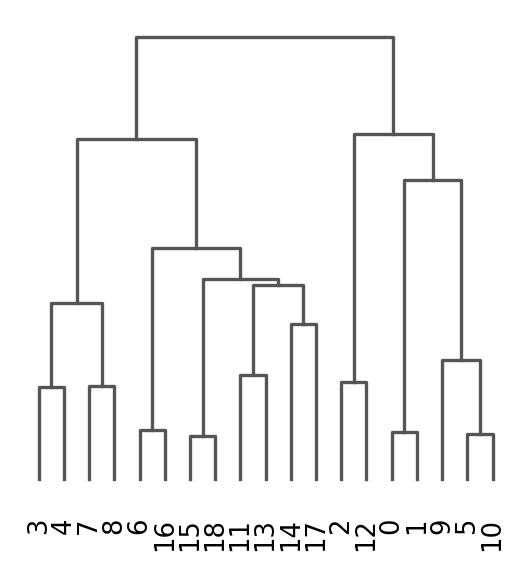

<AxesSubplot:>

In [25]:
sc.tl.dendrogram(tissue, groupby = 'leiden')
sc.pl.dendrogram(tissue, groupby = 'leiden')

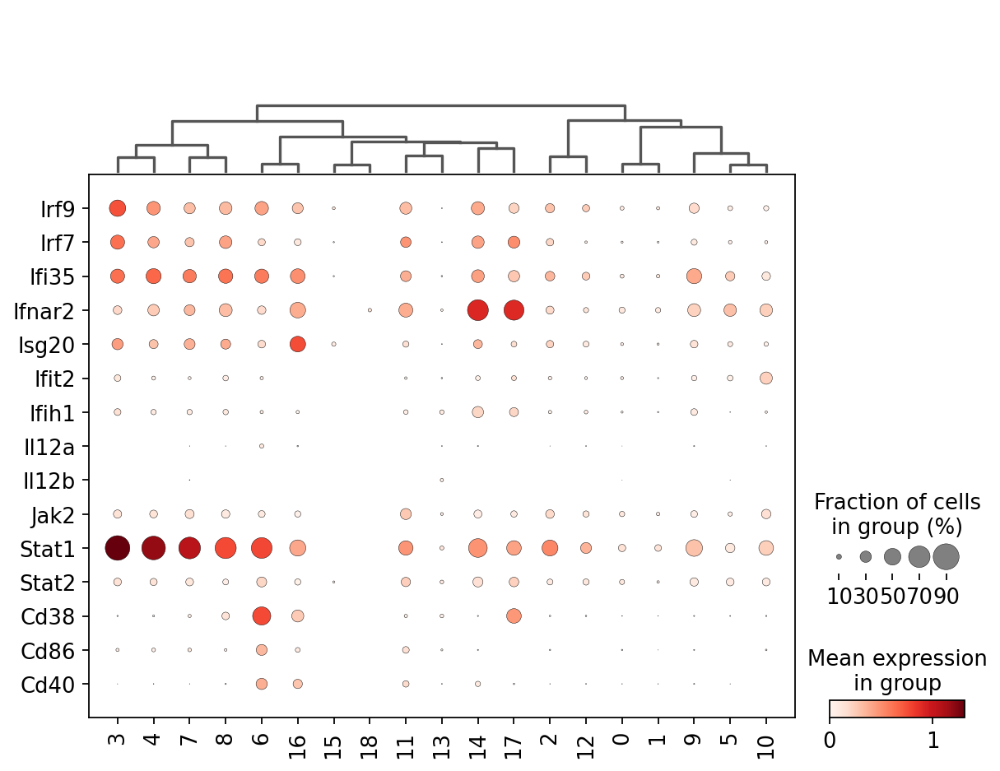

In [26]:
sc.pl.dotplot(tissue, IFN, groupby='leiden', dendrogram=True, swap_axes=True)

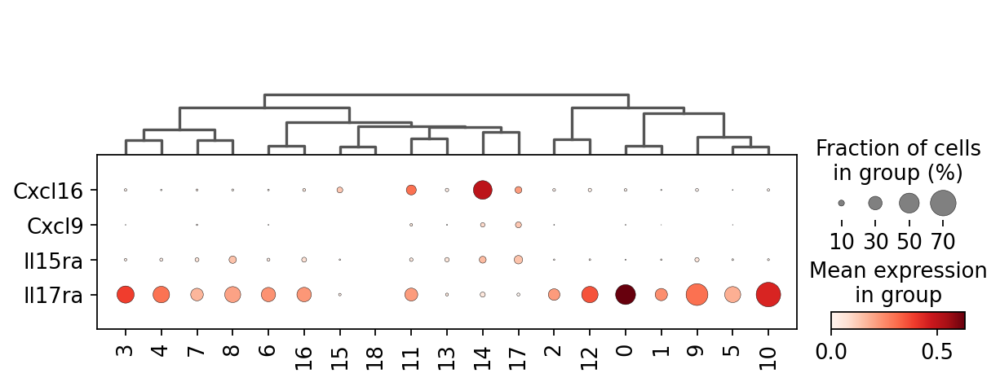

In [27]:
sc.pl.dotplot(tissue, Chemokines, groupby='leiden', dendrogram=True, swap_axes=True)

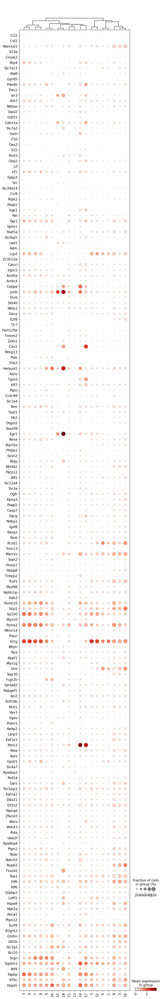

In [28]:
sc.pl.dotplot(tissue, M1, groupby='leiden', dendrogram=True, swap_axes=True)

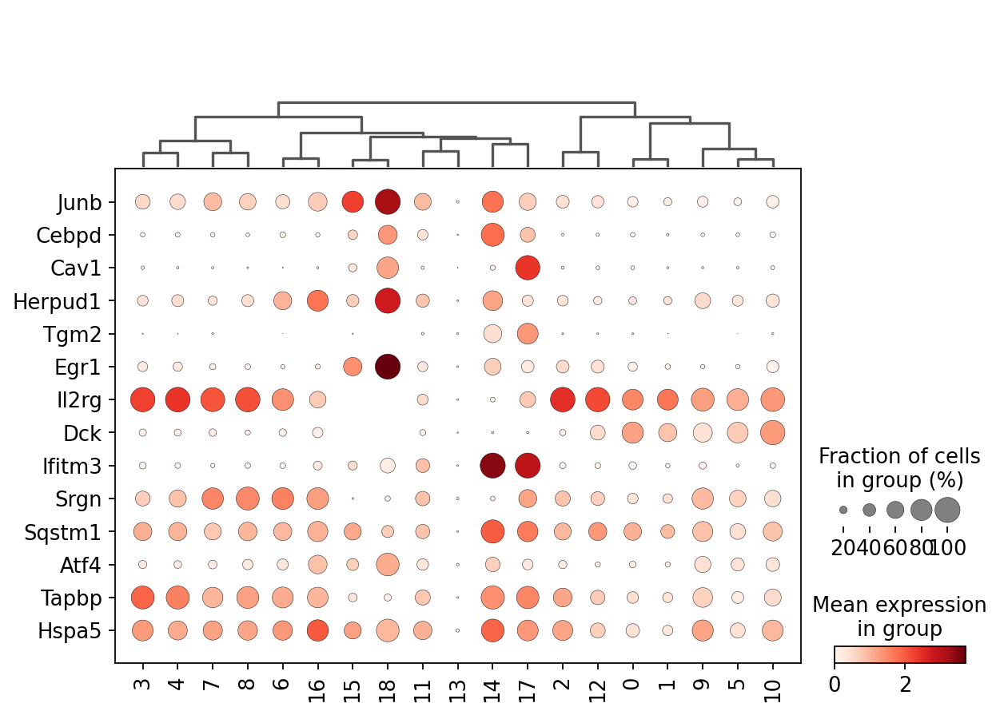

In [29]:
sc.pl.dotplot(tissue, M1_short, groupby='leiden', dendrogram=True, swap_axes=True)

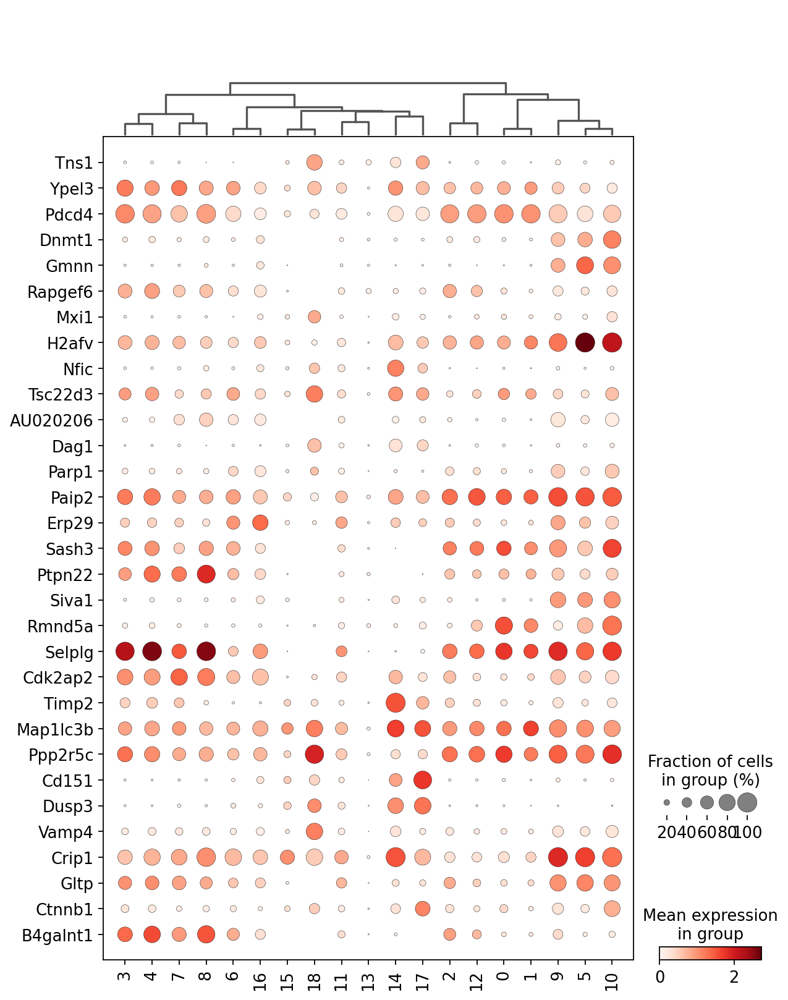

In [30]:
sc.pl.dotplot(tissue, M2_short, groupby='leiden', dendrogram=True, swap_axes=True)

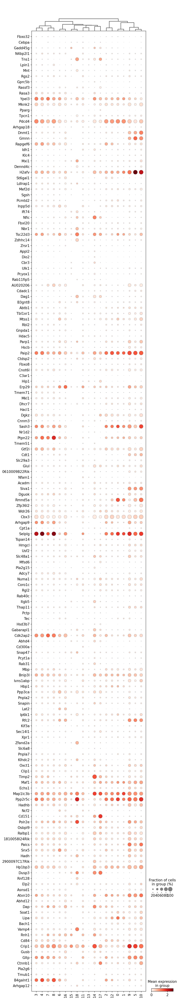

In [31]:
sc.pl.dotplot(tissue, M2, groupby='leiden', dendrogram=True, swap_axes=True)

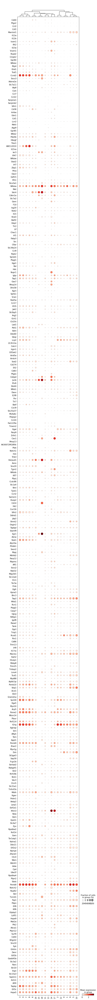

In [32]:
sc.pl.dotplot(tissue, M1_down, groupby='leiden', dendrogram=True, swap_axes=True)

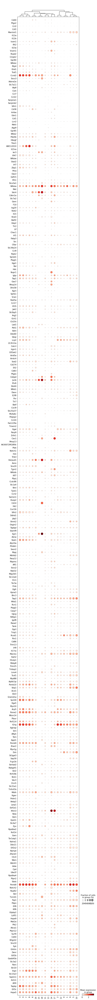

In [33]:
sc.pl.dotplot(tissue, M2_down, groupby='leiden', dendrogram=True, swap_axes=True)

# Characterize cell proportions across ages

In [34]:
from collections import defaultdict

def cell_per_tissue(celltypelist, adata):
    ''' Input is cell type list. Output is a pandas DataFrame 
    of the percentage of that cell type for inputted subsetted adata tissue object'''
    
    data = defaultdict(list)
    
    for a in ages:
        b = adata[adata.obs['age']== a]#filter by age
        for e in celltypelist:#going through keys/tissue types       
            c = b[b.obs['cell_ontology_class']== e]#have adata filtered by cell types in list
            tissue_cell_count = adata.n_obs
            data["Age"].append(a)
            data["Cell Type"].append(e)
            data["Cell Count"].append(c.n_obs)
            data["Cell Type/Tissue %"].append((c.n_obs/b.n_obs)*100)
            
    df = pd.DataFrame(data)
    return df

[Text(0.5, 1.0, 'Cell Type % of Thymus')]

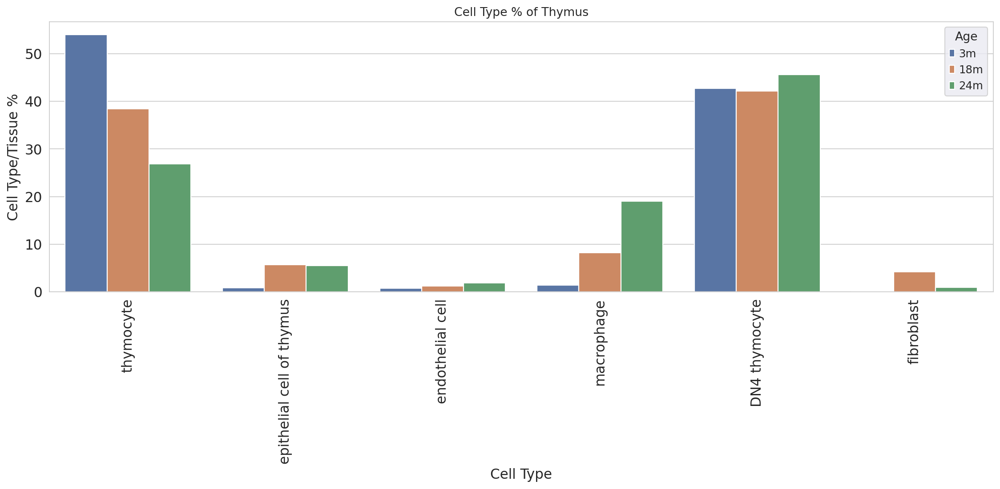

In [35]:
df = cell_per_tissue(tis_cells,tissue)

sns.set_style('whitegrid')
fig = plt.figure(figsize=(17, 5))
plt.xticks(rotation=90)
sns.set(font_scale =1)
sns.barplot(data=df, y="Cell Type/Tissue %", x="Cell Type", hue = "Age").set(title="Cell Type % of Thymus")

In [36]:
mouse_ids = list(set(tissue.obs['mouse.id']))

In [37]:
from collections import defaultdict

def cell_per_tissue2(a_list, adata):
    ''' Input is list and adata tissue object. Output is a pandas DataFrame 
    of the percentage of that cell type for inputted subsetted adata tissue object'''
    
    data = defaultdict(list)
    
    for a in a_list:
        b = adata[adata.obs['mouse.id']== a]#filter by mouse
        for c in tis_cells:       
            d = b[b.obs['cell_ontology_class']== c]#have adata filtered by cell types in list
            tissue_cell_count = b.n_obs
            
            data["mouse.id"].append(a)
            data["Cell Type"].append(c)
            data["Cell Count"].append(d.n_obs)
            data["Cell Type/Tissue %"].append((d.n_obs/b.n_obs)*100)
            
    df = pd.DataFrame(data)
    return df

In [38]:
df2=cell_per_tissue2(mouse_ids,tissue)

In [39]:
df2.groupby(["mouse.id"])[["Cell Type/Tissue %"]].sum()#don't think i need
dd = df2.groupby(["mouse.id", "Cell Type"]).sum()

In [40]:
dd = dd.reset_index('Cell Type')

Pivoting pandas DataFrame so that Cell Type column values becomes columns, and Cell Type/Tissue % populate new columns.

In [41]:
tmp = dd.pivot_table(values='Cell Type/Tissue %', columns="Cell Type", index=dd.index)

Reordering mouse.id X axis

In [42]:
mouse_id_order = [
    '3_8_M', 
    '3_9_M',
    '3_11_M', 
    '3_38_F', 
    '3_39_F', 
    '18_45_M', 
    '18_46_F', 
    '18_47_F', 
    '18_53_M', 
    '24_58_M', 
    '24_59_M',
    '24_60_M', 
    '24_61_M', 
]

tmp = tmp.reindex(mouse_id_order)

**Cell Type % of Thymus per Mouse**

<ipython-input-43-1a8c41979784>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


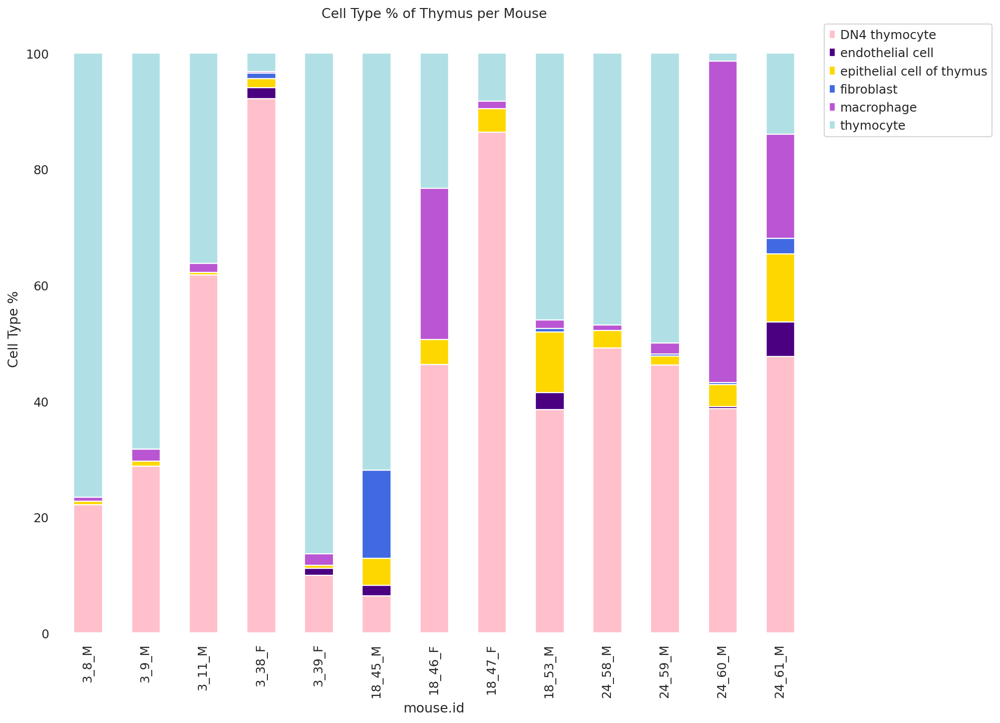

In [43]:
tmp.plot(kind='bar', stacked=True, figsize=(12, 10), color = ['pink','indigo','gold','royalblue','mediumorchid','powderblue'])
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, facecolor = 'white')
plt.title("Cell Type % of Thymus per Mouse")
plt.ylabel('Cell Type %')
ax = plt.axes()
ax.set_facecolor("white")


**Cell Type % of Thymus by Age**

In [44]:
from collections import defaultdict

def cell_per_age(a_list, adata):
    ''' Input is list and adata tissue object. Output is a pandas DataFrame 
    of the percentage of that cell type by age for inputted subsetted adata tissue object'''
    
    data = defaultdict(list)
    
    for a in a_list:
        b = adata[adata.obs['age']== a]#filter by age
        for c in tis_cells:       
            d = b[b.obs['cell_ontology_class']== c]#have adata filtered by cell types in list
            tissue_cell_count = b.n_obs
            
            data["age"].append(a)
            data["Cell Type"].append(c)
            #data["Cell Count"].append(d.n_obs)
            data["Cell Type/Tissue %"].append((d.n_obs/b.n_obs)*100)
            
    df = pd.DataFrame(data)
    return df

In [45]:
ac = cell_per_age(ages,tissue)

In [46]:
ad = ac.groupby(["age", "Cell Type"]).sum()

In [47]:
ad = ad.reset_index('Cell Type')

In [48]:
ae = ad.pivot_table(values='Cell Type/Tissue %', columns="Cell Type", index=ad.index)
ae = ae.reindex(ages)

<ipython-input-49-8b10e0581ed1>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


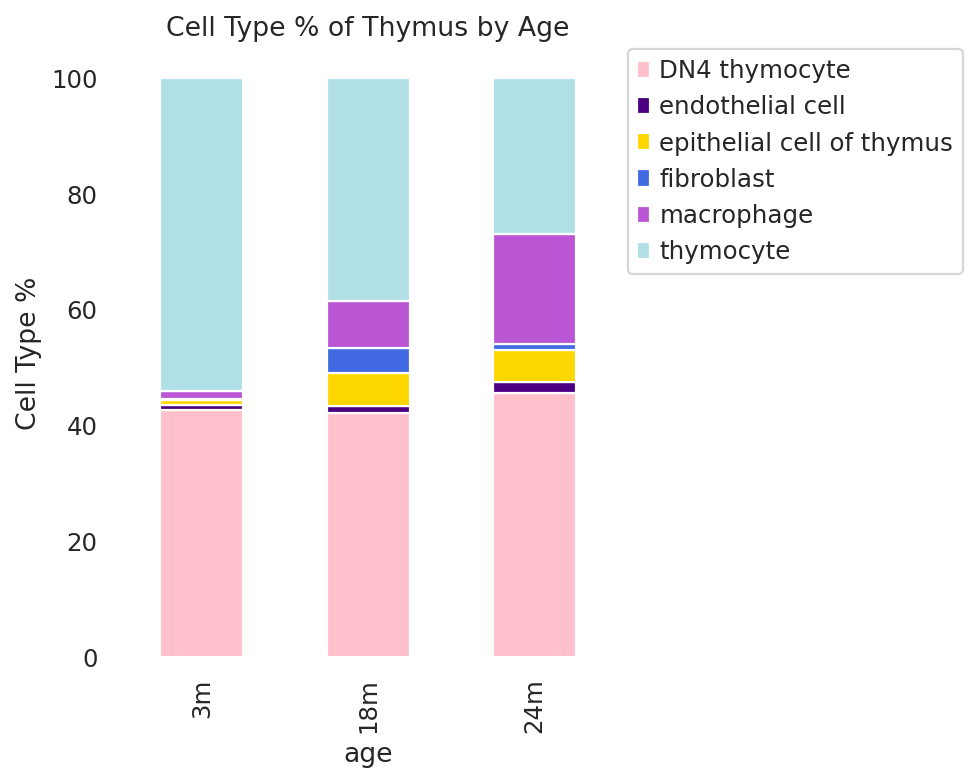

In [49]:
ae.plot(kind='bar', stacked=True, figsize=(4, 5), color = ['pink','indigo','gold','royalblue','mediumorchid','powderblue'])
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, facecolor = 'white')
plt.title("Cell Type % of Thymus by Age")
plt.ylabel('Cell Type %')
ax = plt.axes()
ax.set_facecolor("white")

**Variance of Cell Type % of Thymus across Age**

* I'd like to break apart the macrophage cluster (shows two leiden clusters) into two categories and plot

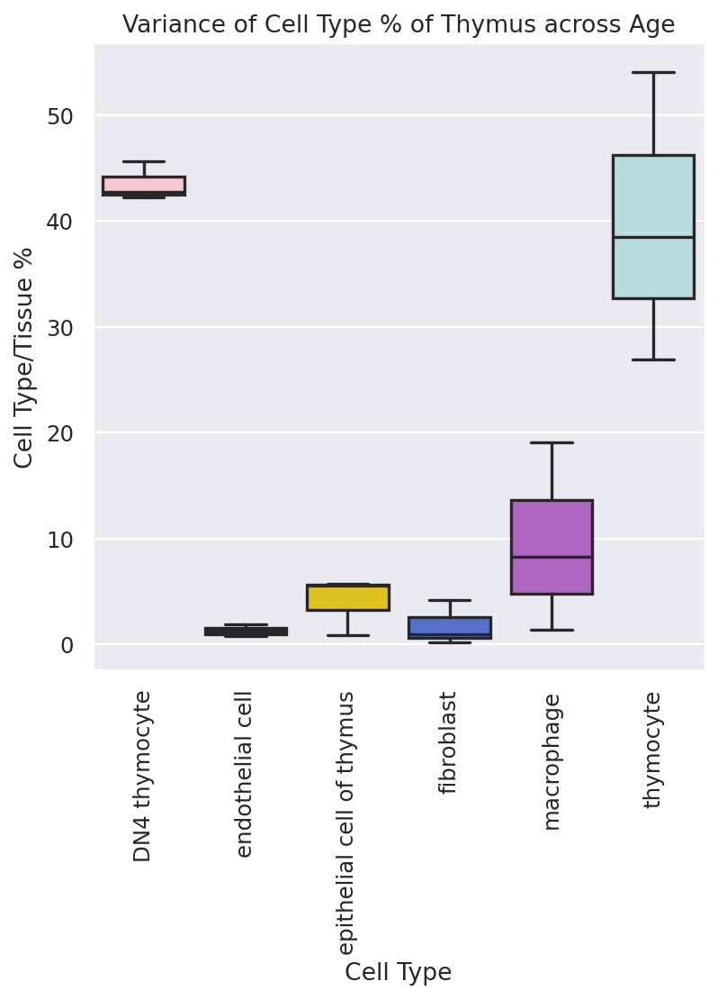

In [50]:
sns.catplot(data = ad, x = 'Cell Type', y = 'Cell Type/Tissue %', kind = "box", palette=sns.color_palette(['pink','indigo','gold','royalblue','mediumorchid','powderblue']))
plt.title("Variance of Cell Type % of Thymus across Age")
sns.set_style("whitegrid")
plt.xticks(rotation=90);


In [51]:
#Angela's to remove 0's from dataframe below

def remove_cats(adata):

    cat_columns = adata.obs.select_dtypes(['category']).columns
    adata.obs[cat_columns] = adata.obs[cat_columns].astype(str)
    
    return adata

In [52]:
tissue = remove_cats(tissue)

In [53]:
'''Angela showing me some pandas tricks and suggestions'''

pd.DataFrame(tissue.obs.groupby(["age",'mouse.id', 'cell_ontology_class']).agg({"mouse.id":[len]}))

mouse.id
                                            len
age mouse.id cell_ontology_class               
18m 18_45_M  DN4 thymocyte                   25
             endothelial cell                 7
             epithelial cell of thymus       18
             fibroblast                      59
             thymocyte                      279
...                                         ...
3m  3_8_M    thymocyte                      121
    3_9_M    DN4 thymocyte                   97
             epithelial cell of thymus        3
             macrophage                       7
             thymocyte                      230

[63 rows x 1 columns]

# Gene expression vars->obs & dataframe

score_genes on M1, M2 and IFN gene lists

In [ ]:
sc.tl.score_genes(tissue, M1, score_name = 'M1')
sc.tl.score_genes(tissue, M2, score_name = 'M2')
sc.tl.score_genes(tissue, IFN, score_name = 'IFN')

To add var gene expression to obs

In [54]:
def gene_expression_obs(adata, listy):
    '''Takes adata object. 
    Returns adata copy with var genes where genes 
    and their expression values are columns in dataframe of adata.'''
    adata2 = adata.copy()
    
    for j in listy:#list(adata2.var.index): took hours & didn't finish
        adata2.obs[j] = adata2[:,j].X.toarray().flatten()
    
    return adata2

To make dataframe from obs gene expression adata

In [55]:
def gene_expression_df(adata, genelist):
    '''Takes adata object and a list of genes. 
    Returns a pandas dataframe where genes and their expression values are columns in dataframe of adata.'''
    df = adata.obs.copy()
    
    for g in genelist:
        df[g] = tissue[:,g].X.toarray().flatten()
    return df   

Removing genes from MitoCarta gene list that are not in .vars

In [56]:
genes = list(mt_nc.copy())

for i in range(len(ignored)):
    for i in ignored:
        if i in genes:
            genes.remove(i) 

In [57]:
'''Checking for duplicate genes'''
dupe_genes = []
for g in genes:
    count = genes.count(g)
    if count > 1:
        dupe_genes.append(g)
print(f'There are {len(dupe_genes)} duplicate genes in genes list')

There are 0 duplicate genes in genes list


In [58]:
'''Checking that all MT genes are in genes (mt_nc) list'''

for m in mt_genes:
    if m in genes:
        print(m,'yes')
    else:
        print(m, 'no') 

mt-Atp6 yes
mt-Atp8 yes
mt-Co1 yes
mt-Co2 yes
mt-Co3 yes
mt-Cytb yes
mt-Nd1 yes
mt-Nd2 yes
mt-Nd3 yes
mt-Nd4 yes
mt-Nd4l yes
mt-Nd5 yes
mt-Nd6 yes
mt-Rnr1 yes
mt-Rnr2 yes
mt-Ta yes
mt-Te yes
mt-Tf yes
mt-Ti yes
mt-Tl1 yes
mt-Tl2 yes
mt-Tm yes
mt-Tp yes
mt-Tq yes
mt-Tt yes
mt-Tv yes


**DataFrames**

In [ ]:
#may be too large?

#df_nc_mt = gene_expression_df(tissue_sg1,list(tissue_sg1.var.index))

In [60]:
#tissue_obs = gene_expression_obs(tissue, list(tissue.var.index)) has ALL genes but running for hoooours
#need to figure out how to save it

In [61]:
#adata has mitochondria and nuclear-encoded mitochondria (MitoCarta3.0) gene expressions in obs
tissue2 = gene_expression_obs(tissue, genes)

In [105]:
#has IFN genes from IFN gene list in obs
tissueI = gene_expression_obs(tissue, IFN)

In [63]:
#df has mitochondria and nuclear-encoded mitochondria (MitoCarta3.0) gene expressions
tissue3 = gene_expression_df(tissue2, genes)

In [110]:
#df has IFN genes from IFN gene list
tissueIFN = gene_expression_df(tissue, IFN)

In [65]:
#df has M1 and M2 genes from M1 and M2 gene lists in obs
tissue_M = gene_expression_df(tissue, M)

In [66]:
#df has Chemokine genes from Chemokine gene list
tissueChemokines = gene_expression_df(tissue, Chemokines)

## leiden cluster breakdown

Only the clusters that have annotated macrophages present

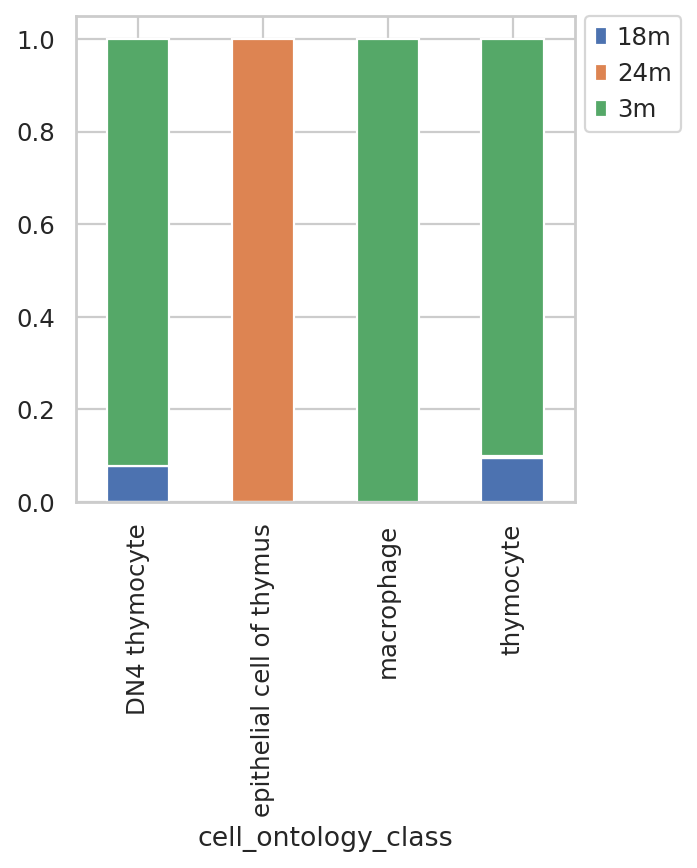

In [67]:
leiden0 = tissue[tissue.obs['leiden']=='0']
l = pd.crosstab(leiden0.obs['cell_ontology_class'],leiden0.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

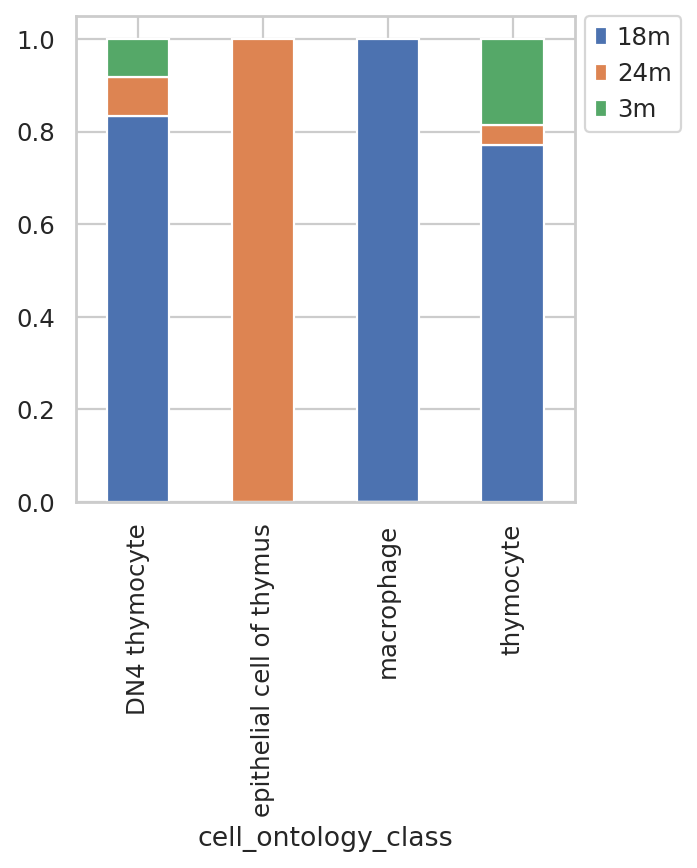

In [68]:
leiden1 = tissue[tissue.obs['leiden']=='1']
l = pd.crosstab(leiden1.obs['cell_ontology_class'],leiden1.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

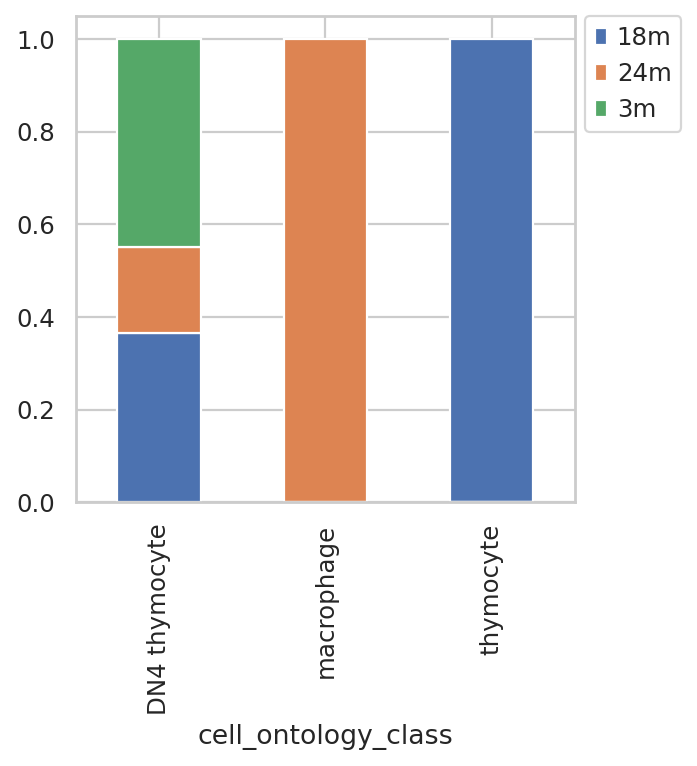

In [69]:
leiden3 = tissue[tissue.obs['leiden']=='3']
l = pd.crosstab(leiden3.obs['cell_ontology_class'],leiden3.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

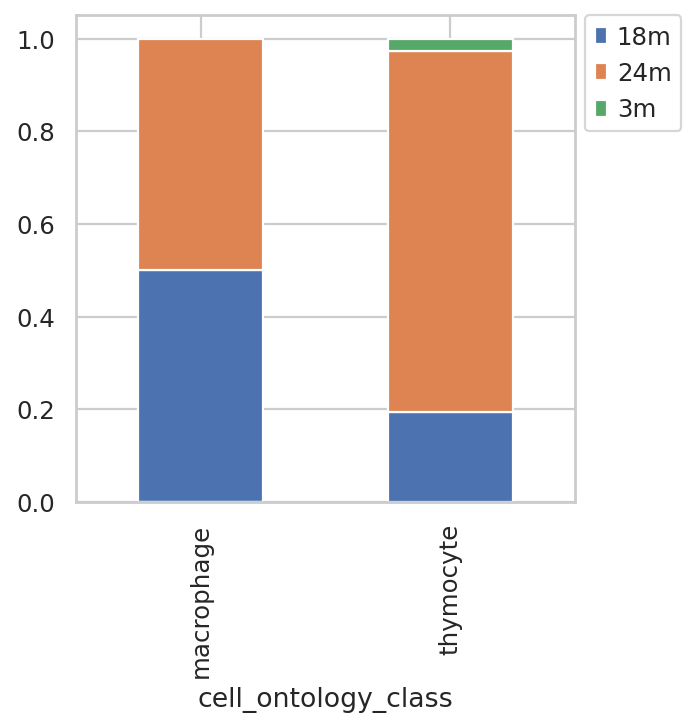

In [70]:
leiden5 = tissue[tissue.obs['leiden']=='5']
l = pd.crosstab(leiden5.obs['cell_ontology_class'],leiden5.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

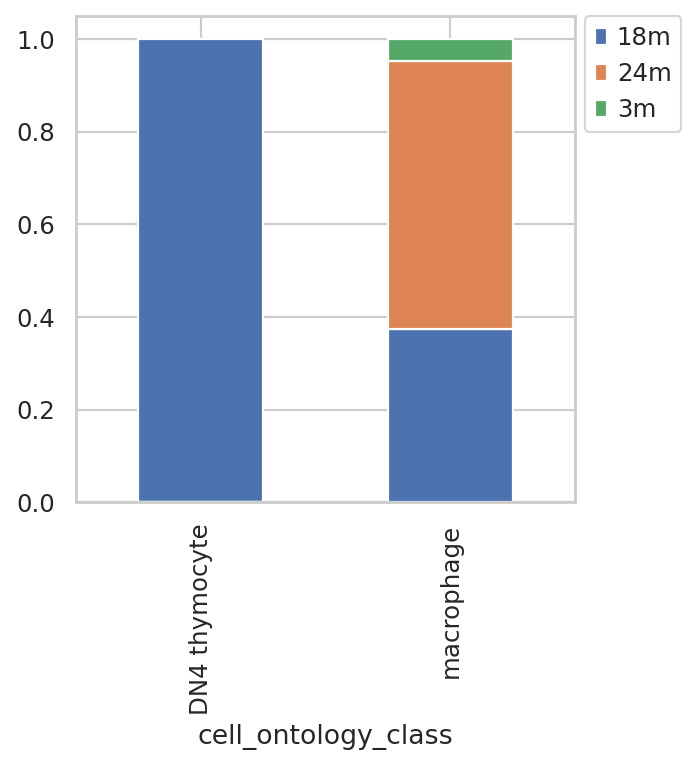

In [71]:
leiden6 = tissue[tissue.obs['leiden']=='6']
l = pd.crosstab(leiden6.obs['cell_ontology_class'],leiden6.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

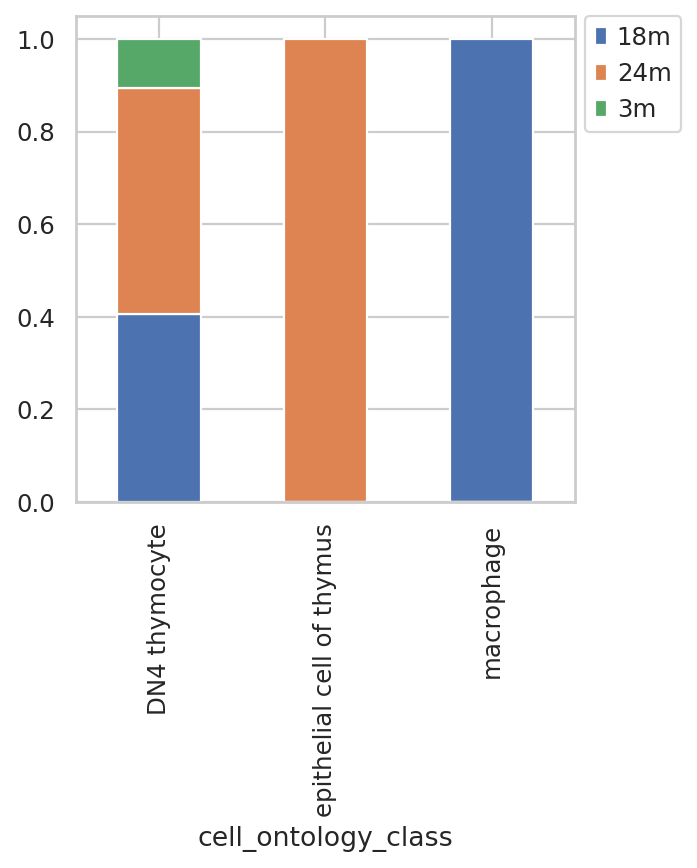

In [72]:
leiden7 = tissue[tissue.obs['leiden']=='7']
l = pd.crosstab(leiden7.obs['cell_ontology_class'],leiden7.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

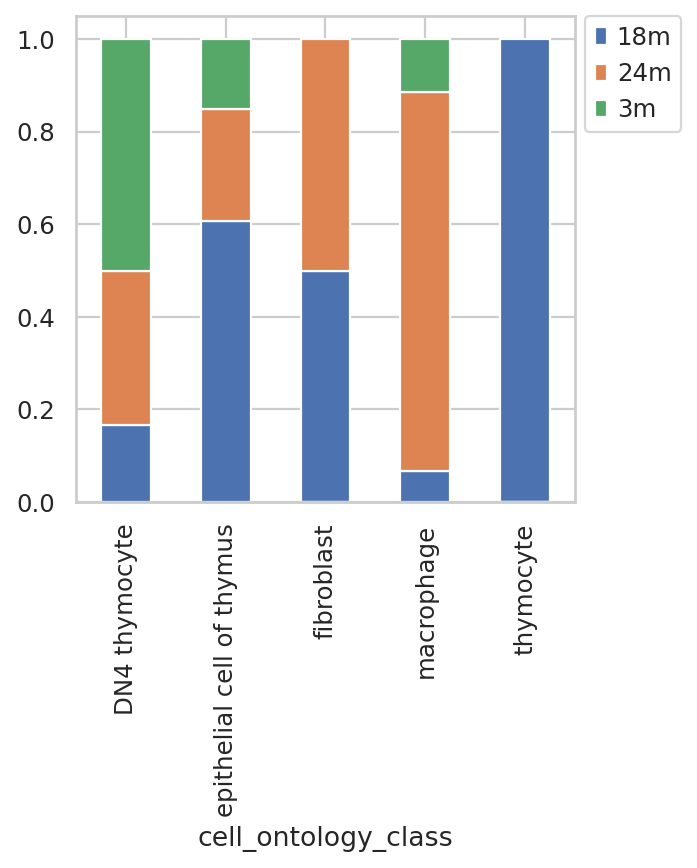

In [73]:
leiden11 = tissue[tissue.obs['leiden']=='11']
l = pd.crosstab(leiden11.obs['cell_ontology_class'],leiden11.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

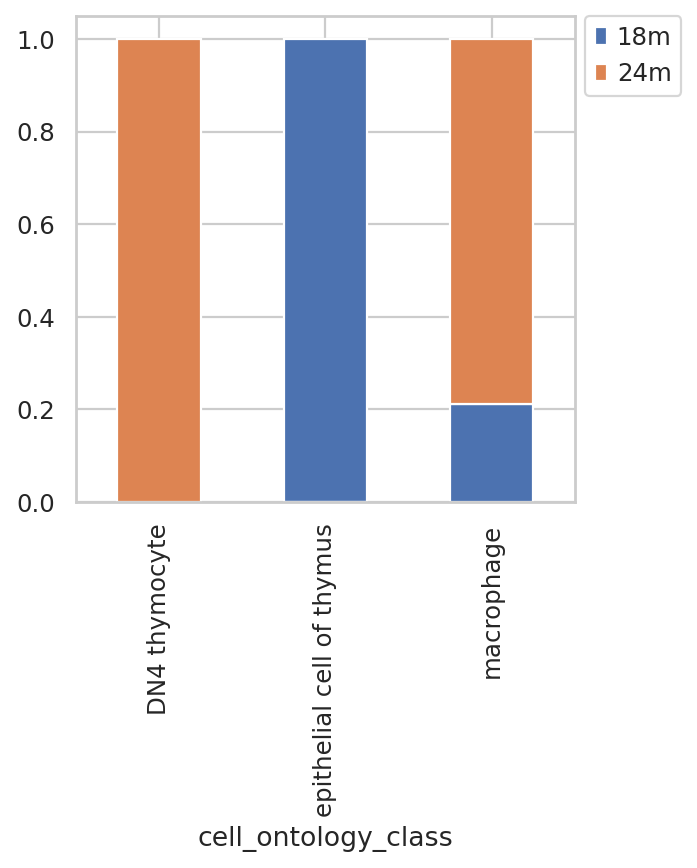

In [74]:
leiden16 = tissue[tissue.obs['leiden']=='16']
l = pd.crosstab(leiden16.obs['cell_ontology_class'],leiden16.obs['age'], normalize='index')
l.plot.bar(stacked=True).legend(loc='upper right')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

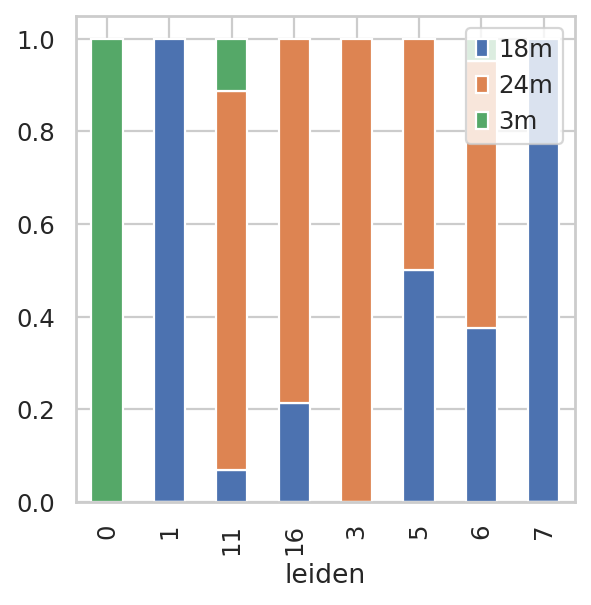

In [75]:
m = tissue[tissue.obs['cell_ontology_class']=='macrophage']
mp = pd.crosstab(m.obs['leiden'],m.obs['age'], normalize='index')
mp.plot.bar(stacked=True).legend(loc='upper right')

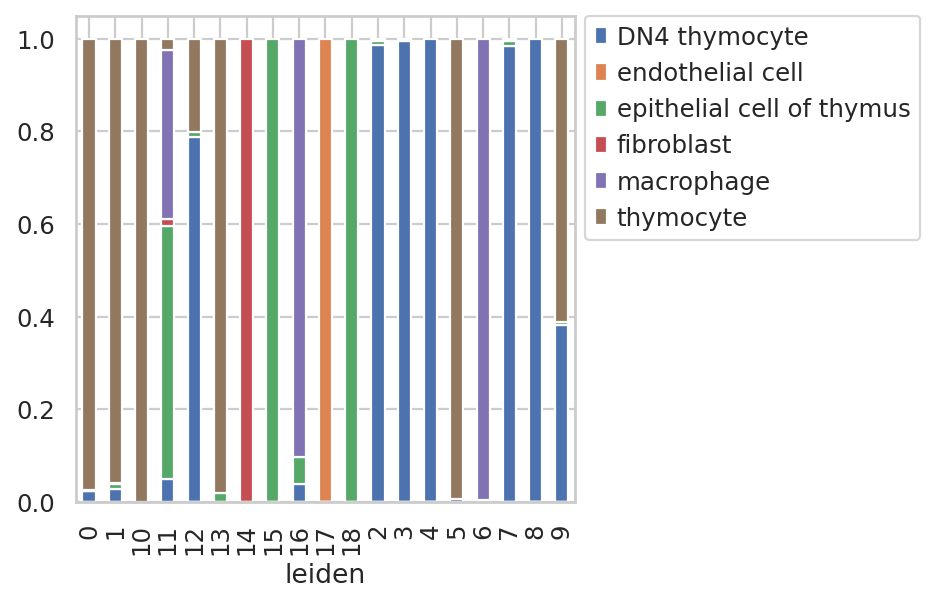

In [76]:
tmp = pd.crosstab(tissue.obs['leiden'],tissue.obs['cell_ontology_class'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper left')
plt.legend(bbox_to_anchor=(1.02, 1), borderaxespad=0, facecolor = 'white')

# MT and MitoCarta score_genes

**Save MT score_genes result** (unhash if doing for the first time)

* score_genes_cell_cycle(adata, s_genes, g2m_genes)
* mt_genes -> s_genes
* mt_nc_genes -> g2m_genes

A function to make a dataframe of gene_scores and gene expression score by cell

In [77]:
def cell_gene_exp_df(gene, adata):
    ''' Input is gene name that has an obs.gene_score. 
    Output is a pandas DataFrame with two columns: cell index and gene's gene_score'''
    
    data = defaultdict(list)
    
    for d in list(adata.obs['cell']):
        data["Cell"].append(d)
        
        cg = adata[adata.obs.cell == d, adata.var.index == gene]
        data["Gene Expression"].append(cg.X[0,0]) 
    
    #for g in list(adata.obs[gene]):
    #    data["gene_score"].append(g)
       
    df = pd.DataFrame(data)
    return df

In [78]:
#tissue_score_genes = sc.tl.score_genes_cell_cycle(tissue, mt_genes, mt_nc_genes, copy = True)

In [79]:
tissue_score_genes_path = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tissue_sg1_02172022.h5ad"
#tissue_sg1.write(tissue_score_genes_path)
tissue_sg1 = sc.read_h5ad(tissue_score_genes_path)

In [80]:
tissue_sg1.obs[['age','cell_ontology_class','S_score','G2M_score']]

,age,cell_ontology_class,S_score,G2M_score
index,,,,
A10.MAA000609.3_8_M.1.1-1-1-0-0-0,3m,thymocyte,0.796745,0.291137
A13.MAA000609.3_8_M.1.1-1-1-0-0-0,3m,DN4 thymocyte,0.726157,0.121809
A21.MAA000609.3_8_M.1.1-1-1-0-0-0,3m,thymocyte,0.820534,0.228290
A22.MAA000609.3_8_M.1.1-1-1-0-0-0,3m,thymocyte,0.725058,0.144226
A3.MAA000609.3_8_M.1.1-1-1-0-0-0,3m,thymocyte,0.731966,0.170257
...,...,...,...,...
M20_B000235_B007504_S308.mm10-plus-0-0-1-0-0,18m,endothelial cell,1.127306,0.102458
M21_B000235_B007504_S309.mm10-plus-0-0-1-0-0,18m,endothelial cell,0.953228,0.096130
M22_B000235_B007504_S310.mm10-plus-0-0-1-0-0,18m,endothelial cell,0.943676,0.097423


**Check this out!**  

tissue_sg1 is after using it. sc.tl.score_genes_cell_cycle seems to change the Gene Expression values. 

tissue is the adata before using sc.tl.score_genes_cell_cycle.

**Before going through sc.tl.score_genes_cell_cycle there aren't negative gene expression values.**

In [81]:
cell_gene_exp_df('Nr4a1',tissue)

,Cell,Gene Expression
0,A10.MAA000609.3_8_M.1.1,0.017852
1,A13.MAA000609.3_8_M.1.1,0.000000
2,A21.MAA000609.3_8_M.1.1,0.019248
3,A22.MAA000609.3_8_M.1.1,0.000000
4,A3.MAA000609.3_8_M.1.1,0.005416
...,...,...
4027,M20_B000235,0.000000
4028,M21_B000235,0.000000
4029,M22_B000235,0.000000
4030,N18_B000235,0.520420


**But after going through sc.tl.score_genes_cell_cycle the values are now negative**

In [82]:
cell_gene_exp_df('Nr4a1',tissue_sg1)

,Cell,Gene Expression
0,A10.MAA000609.3_8_M.1.1,-0.625617
1,A13.MAA000609.3_8_M.1.1,-0.640107
2,A21.MAA000609.3_8_M.1.1,-0.624484
3,A22.MAA000609.3_8_M.1.1,-0.640107
4,A3.MAA000609.3_8_M.1.1,-0.635712
...,...,...
4027,M20_B000235,-0.640107
4028,M21_B000235,-0.640107
4029,M22_B000235,-0.640107
4030,N18_B000235,-0.217686


# ## Statistics tests on gene expression

In [83]:
#I think I need to use a dataframe that has ALL the genes as columns, not just my genes of interest.

In [84]:
sc.tl.score_genes(tissue, M1, score_name = 'M1')
sc.tl.score_genes(tissue, M2, score_name = 'M2')
sc.tl.score_genes(tissue, IFN, score_name = 'IFN')

computing score 'M1'
    finished: added
    'M1', score of gene set (adata.obs).
    645 total control genes are used. (0:00:00)


## statannot plots

### mt genes

#### mt-Atp6

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.168e-02 U_stat=1.263e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.340e-03 U_stat=1.751e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.393e-60 U_stat=2.661e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.070e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.700e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

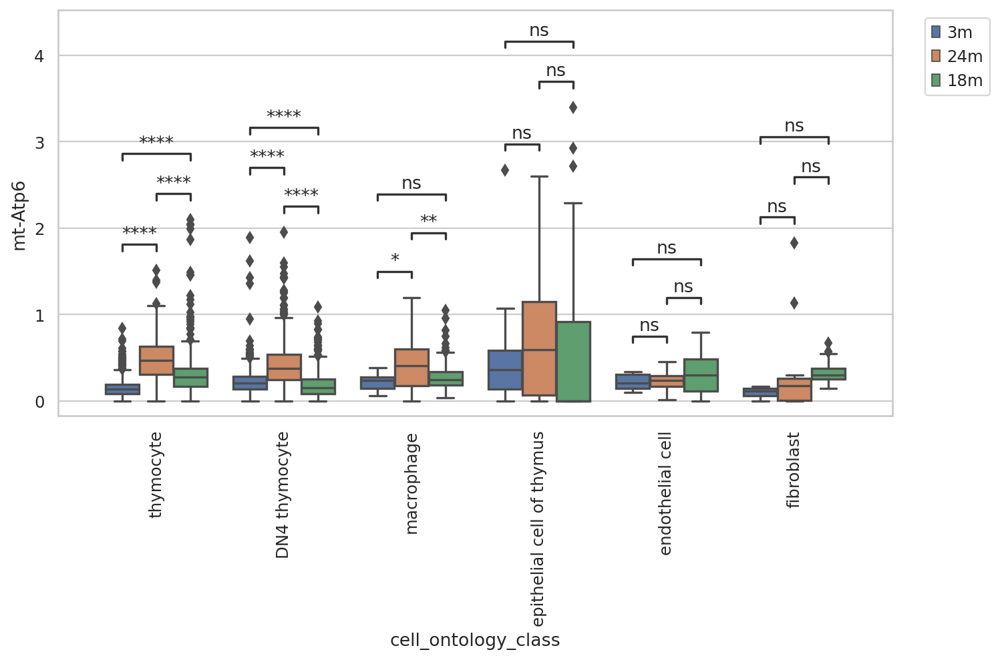

In [88]:
df = tissue3[['age','cell_ontology_class','mt-Atp6']]

x = "cell_ontology_class" 
y = "mt-Atp6" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Atp8

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.277e-17 U_stat=3.249e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.372e-27 U_stat=7.229e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.435e-16 U_stat=1.384e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.251e-02 U_stat=1.780e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.306e-01 U_stat=1.430e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

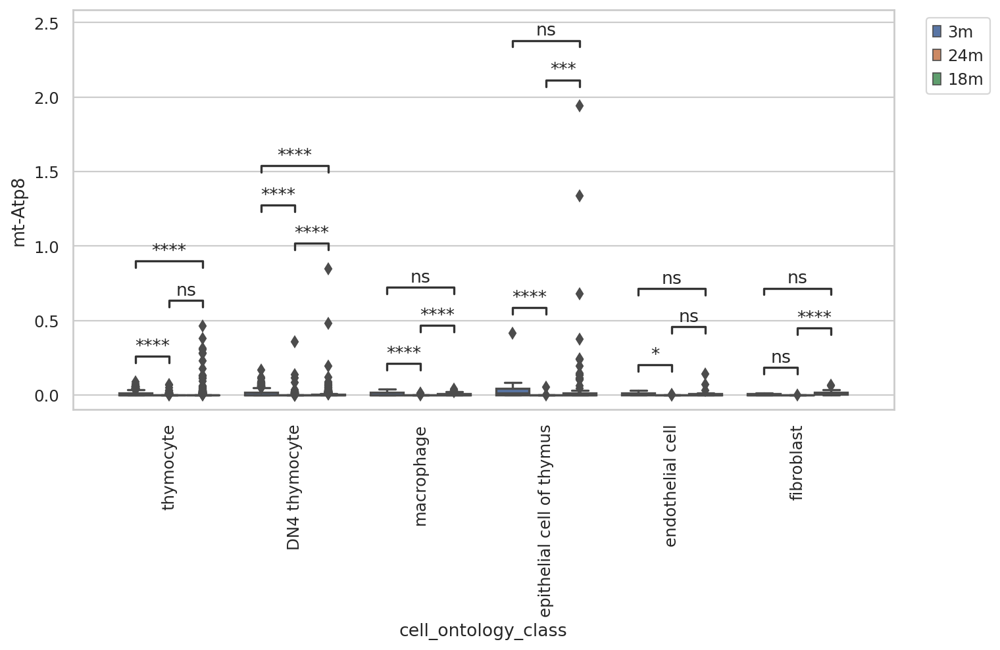

In [89]:
df = tissue3[['age','cell_ontology_class','mt-Atp8']]

x = "cell_ontology_class" 
y = "mt-Atp8" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Co1

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.354e-01 U_stat=1.531e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.975e-05 U_stat=1.814e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.988e-12 U_stat=2.128e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.560e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.207e-03 U_stat=6.800e+01
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

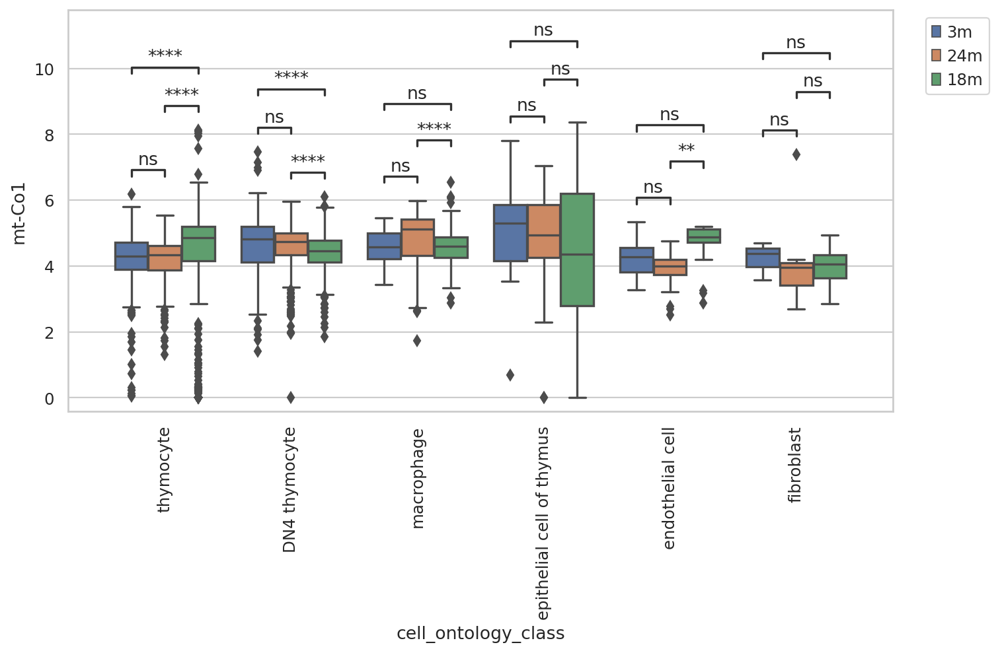

In [90]:
df = tissue3[['age','cell_ontology_class','mt-Co1']]

x = "cell_ontology_class" 
y = "mt-Co1" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Co2

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.097e-05 U_stat=7.860e+02
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.462e-07 U_stat=1.902e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.388e-72 U_stat=2.756e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.265e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

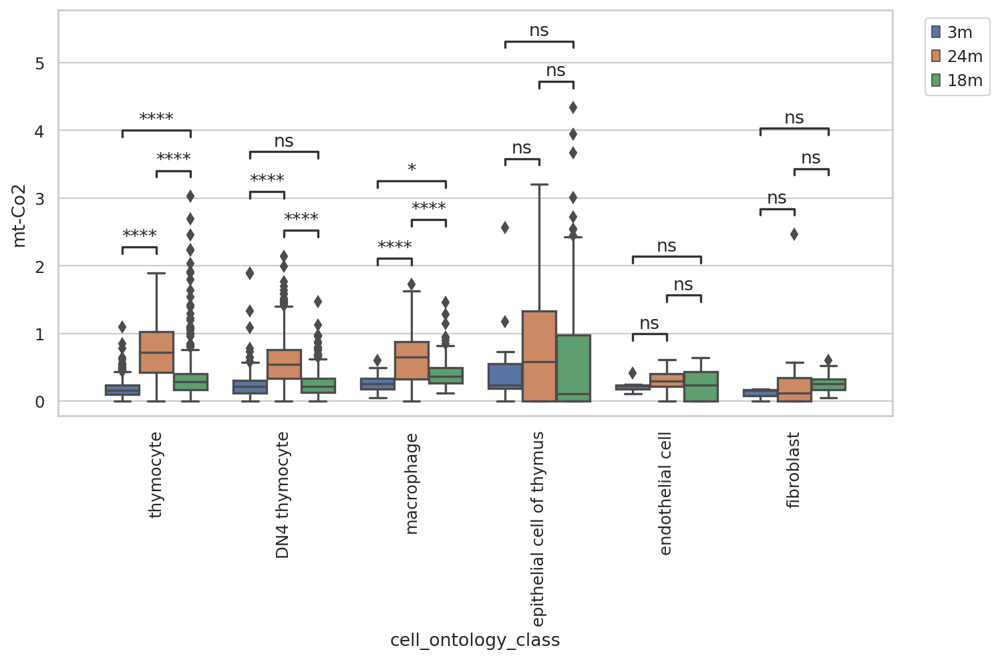

In [91]:
df = tissue3[['age','cell_ontology_class','mt-Co2']]

x = "cell_ontology_class" 
y = "mt-Co2" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Co3

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.466e-01 U_stat=1.534e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.378e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.966e-47 U_stat=2.552e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.538e-02 U_stat=1.970e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.510e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

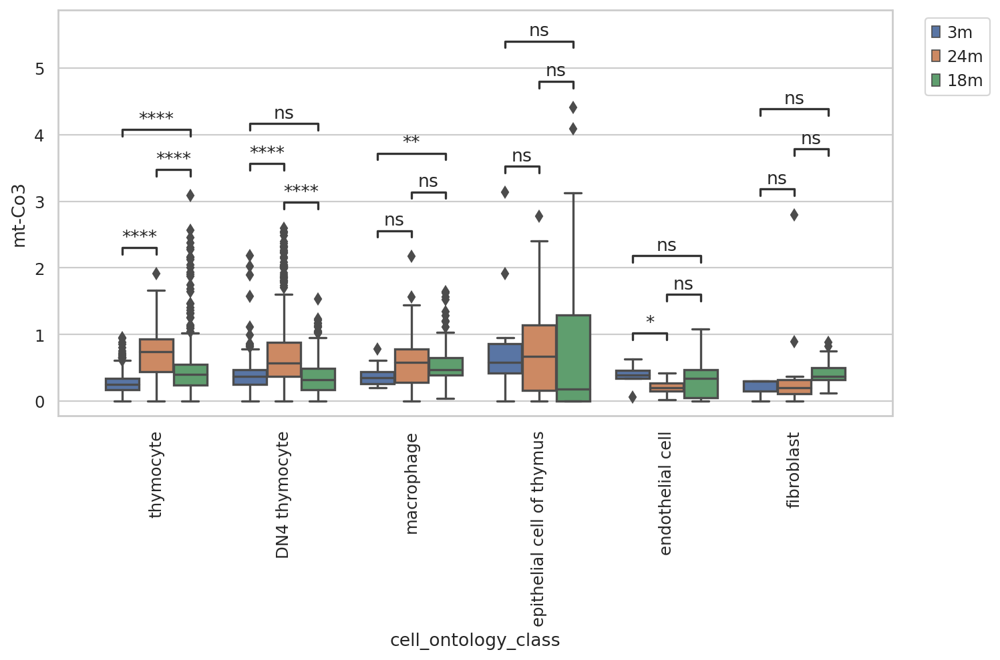

In [92]:
df = tissue3[['age','cell_ontology_class','mt-Co3']]

x = "cell_ontology_class" 
y = "mt-Co3" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Cytb

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.968e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.494e-07 U_stat=8.871e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.684e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.679e-02 U_stat=2.000e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.758e-03 U_stat=6.500e+01
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

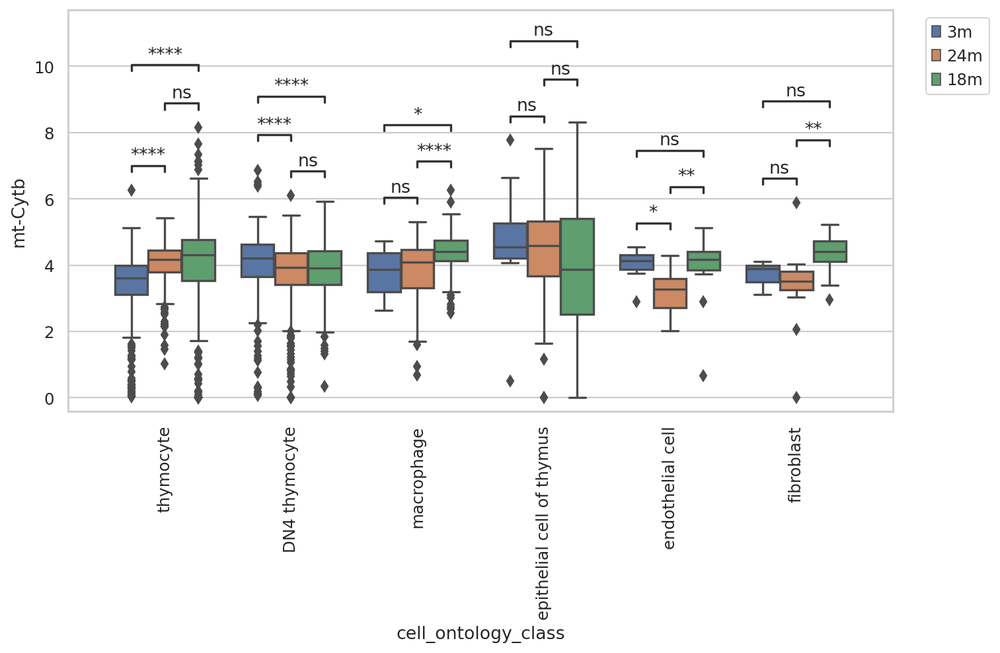

In [93]:
df = tissue3[['age','cell_ontology_class','mt-Cytb']]

x = "cell_ontology_class" 
y = "mt-Cytb" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Nd1

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.052e-01 U_stat=2.824e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.459e-04 U_stat=9.878e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.690e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.073e-01 U_stat=1.800e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.353e-01 U_stat=1.090e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

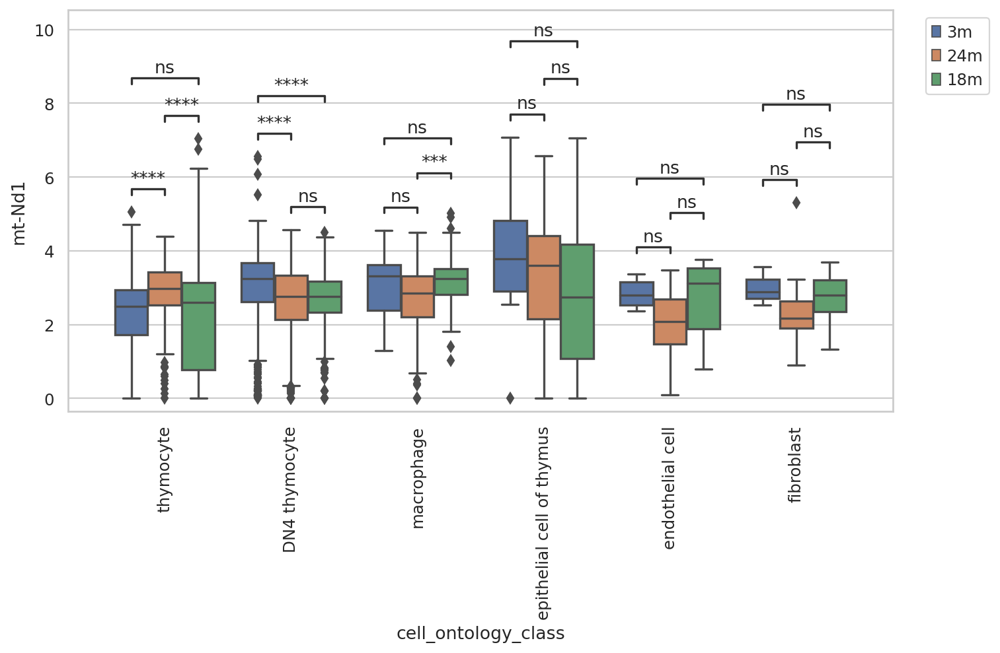

In [94]:
df = tissue3[['age','cell_ontology_class','mt-Nd1']]

x = "cell_ontology_class" 
y = "mt-Nd1" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Nd2

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.766e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.940e-08 U_stat=8.561e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.672e-02 U_stat=1.899e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.264e-02 U_stat=2.020e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.059e-03 U_stat=5.400e+01
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

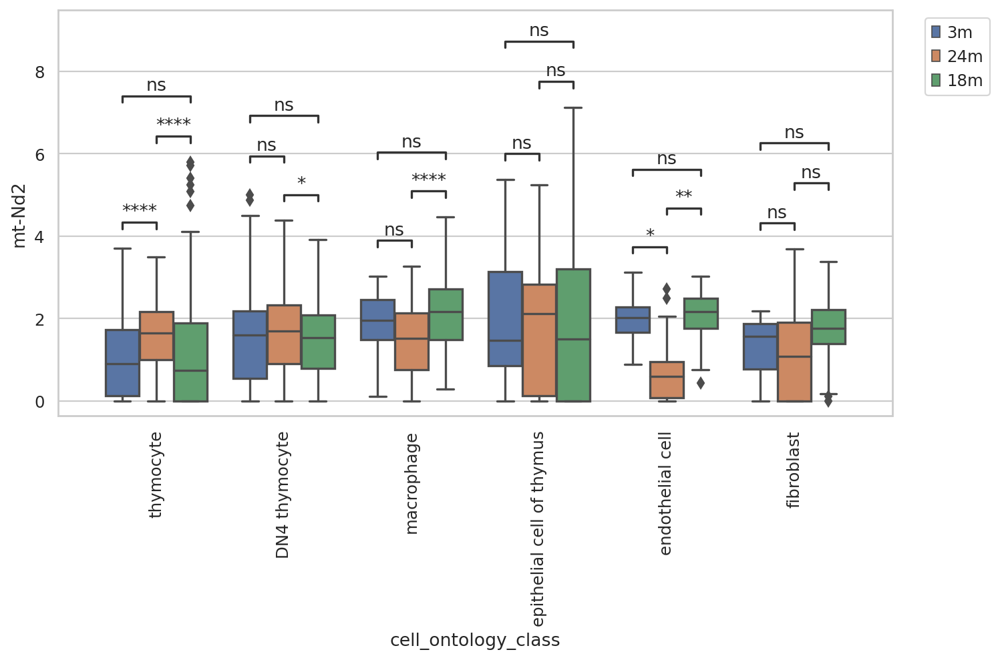

In [95]:
df = tissue3[['age','cell_ontology_class','mt-Nd2']]

x = "cell_ontology_class" 
y = "mt-Nd2" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Nd3

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.316e-03 U_stat=3.374e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.003e-23 U_stat=4.637e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.813e-13 U_stat=1.271e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.057e-04 U_stat=2.300e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.153e-01 U_stat=9.750e+01
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

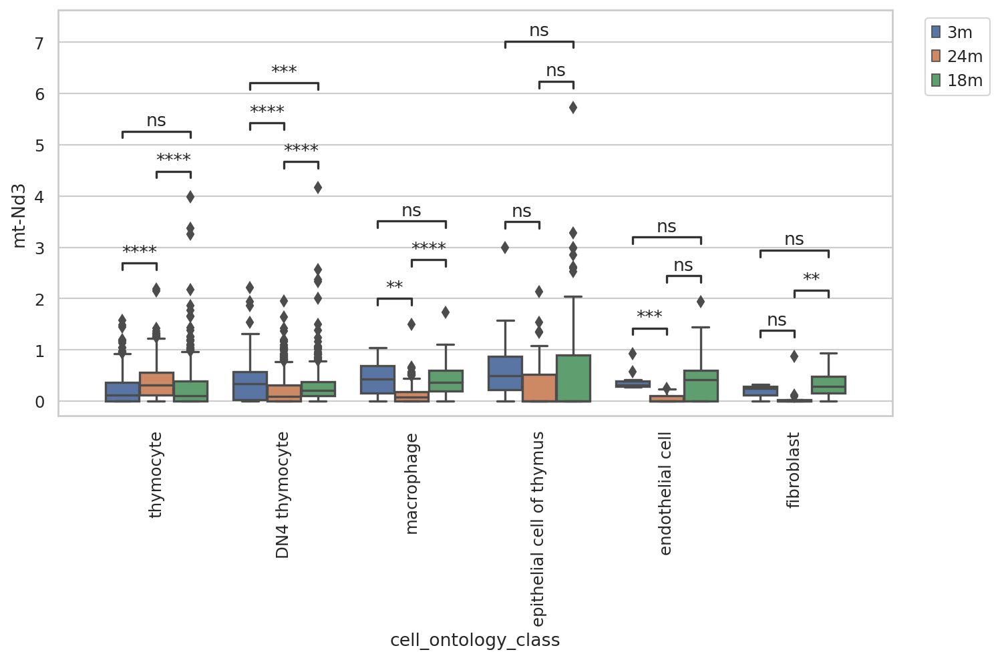

In [96]:
df = tissue3[['age','cell_ontology_class','mt-Nd3']]

x = "cell_ontology_class" 
y = "mt-Nd3" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Nd4

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.140e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.046e-02 U_stat=1.677e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.284e-06 U_stat=2.002e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.857e-01 U_stat=1.670e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.330e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

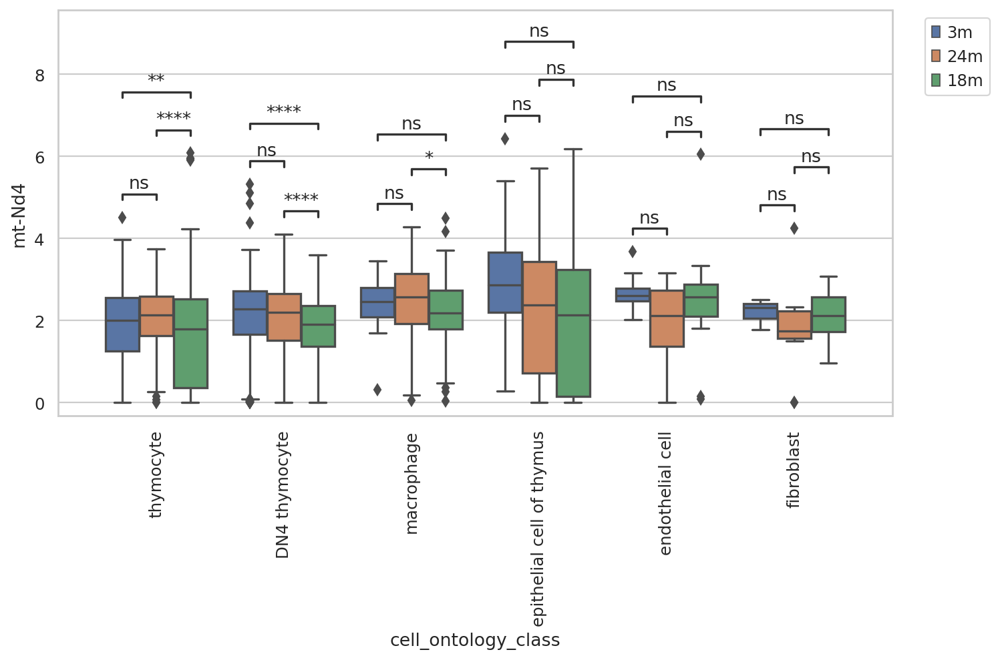

In [97]:
df = tissue3[['age','cell_ontology_class','mt-Nd4']]

x = "cell_ontology_class" 
y = "mt-Nd4" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Nd4l

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.918e-17 U_stat=3.031e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.037e-06 U_stat=1.223e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.673e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.320e-01 U_stat=1.460e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.800e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

ValueError: All numbers are identical in mannwhitneyu

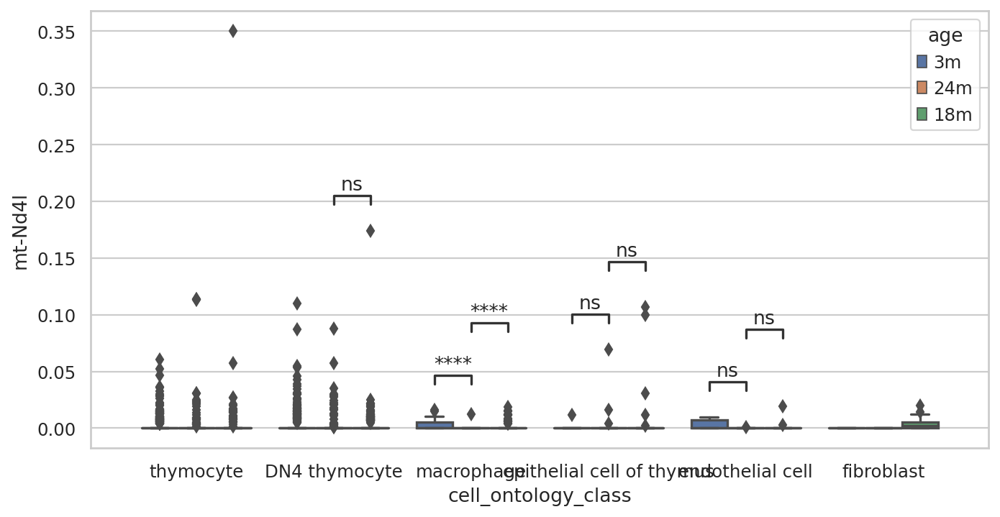

In [98]:
df = tissue3[['age','cell_ontology_class','mt-Nd4l']]

x = "cell_ontology_class" 
y = "mt-Nd4l" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


#### mt-Nd5

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.168e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.624e-04 U_stat=9.899e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.927e-01 U_stat=1.576e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.630e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.280e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

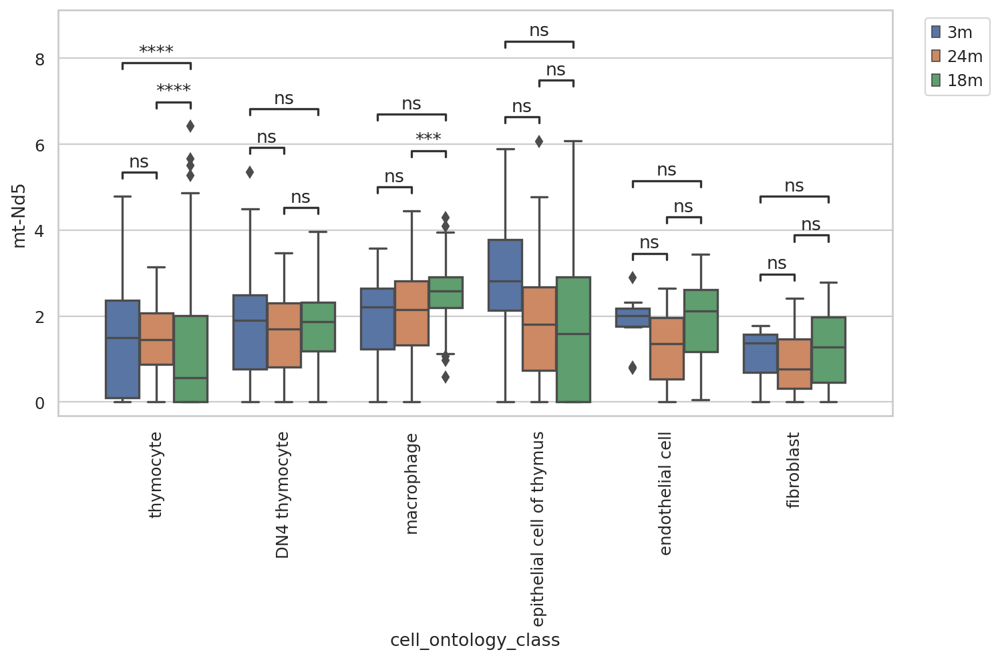

In [99]:
df = tissue3[['age','cell_ontology_class','mt-Nd5']]

x = "cell_ontology_class" 
y = "mt-Nd5" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Nd6

In [ ]:
df = tissue3[['age','cell_ontology_class','mt-Nd6']]

x = "cell_ontology_class" 
y = "mt-Nd6" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Rnr1

In [ ]:
df = tissue3[['age','cell_ontology_class','mt-Rnr1']]

x = "cell_ontology_class" 
y = "mt-Rnr1" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### mt-Rnr2

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.476e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.238e-01 U_stat=1.584e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.250e-03 U_stat=1.938e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.330e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

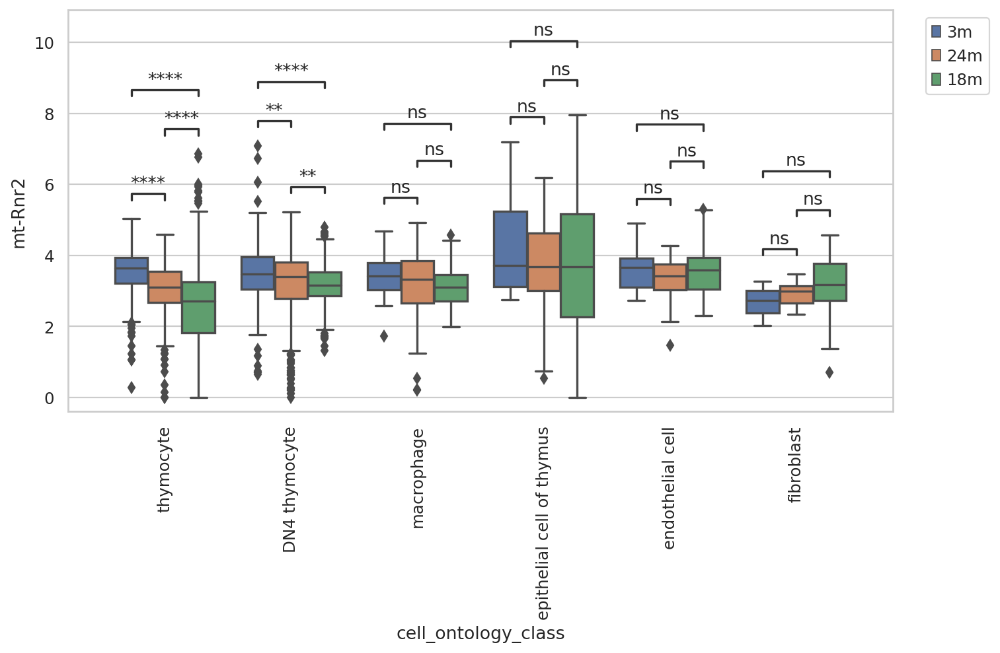

In [100]:
df = tissue3[['age','cell_ontology_class','mt-Rnr2']]

x = "cell_ontology_class" 
y = "mt-Rnr2" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)


### Genes and score_genes

#### Cd38

Cd38 has a zero inflated distribution so I don't think this test works. However it is interesting to see CD38 expression in annotated endothelial cells

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.612e-01 U_stat=1.583e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.181e-02 U_stat=1.117e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.688e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.938e-01 U_stat=1.760e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.030e+02


ValueError: All numbers are identical in mannwhitneyu

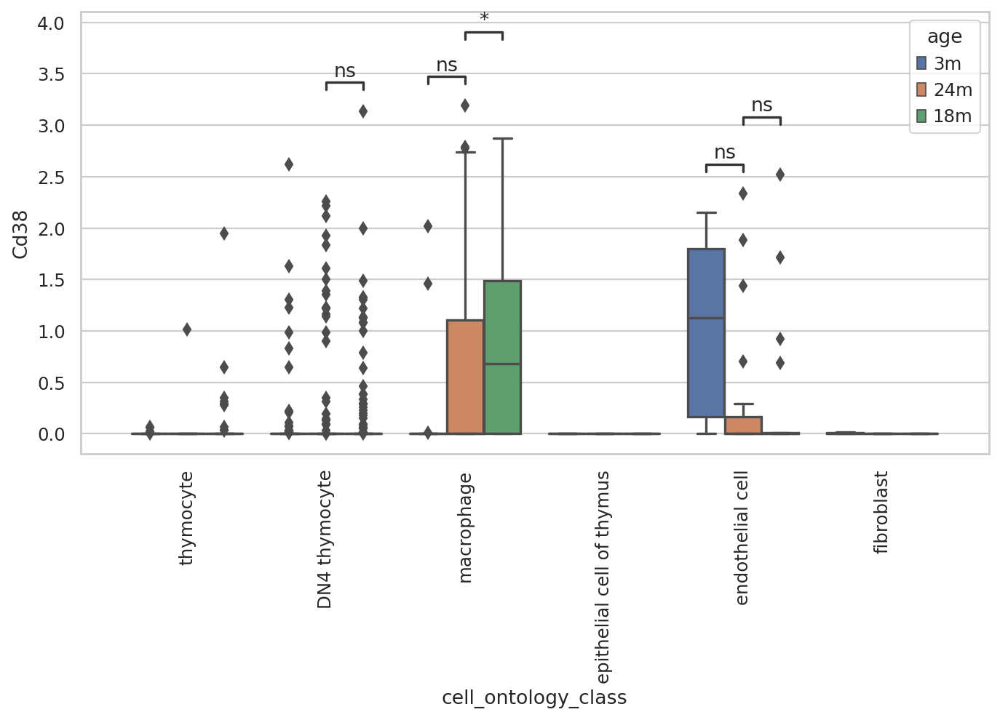

In [101]:
df = tissueIFN[['age','cell_ontology_class','Cd38']]

x = "cell_ontology_class" 
y = "Cd38" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

#### IFN score_genes

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.542e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.277e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.730e-08 U_stat=1.366e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.300e+01
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.320e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.

(<AxesSubplot:xlabel='cell_ontology_class', ylabel='IFN'>,
  <statannot.StatResult.StatResult at 0x7f8884f638e0>])

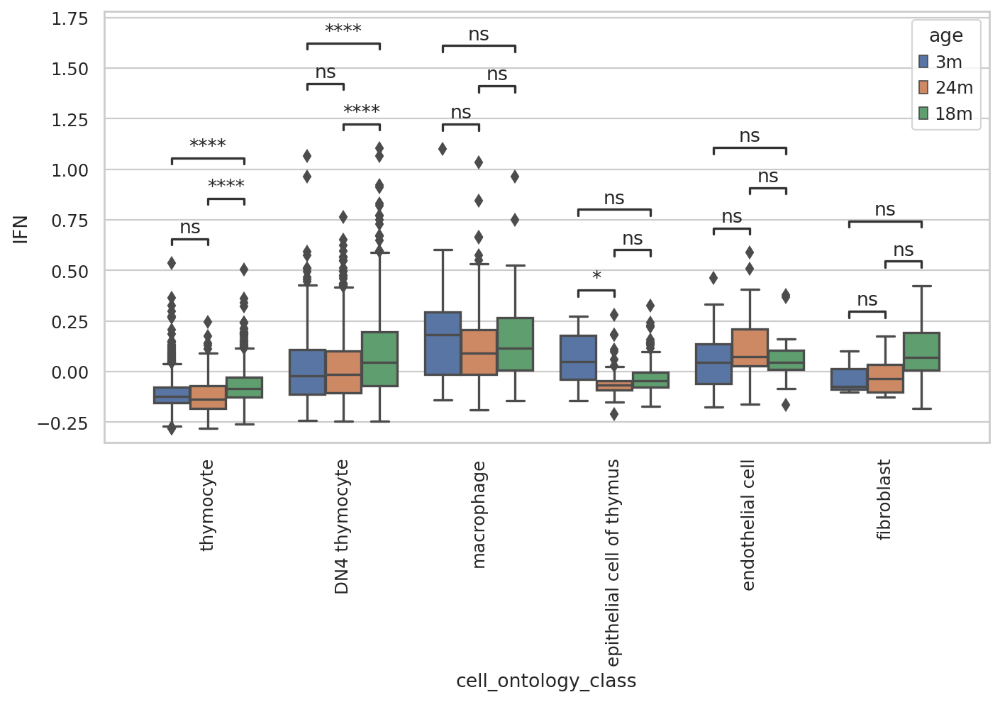

In [111]:
df = tissueIFN[['age','cell_ontology_class','IFN']]

x = "cell_ontology_class" 
y = "IFN" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

#### M1 score_genes

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.391e-01 U_stat=2.944e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.275e-01 U_stat=1.606e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.612e-13 U_stat=1.260e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.450e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.984e-02 U_stat=3.000e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

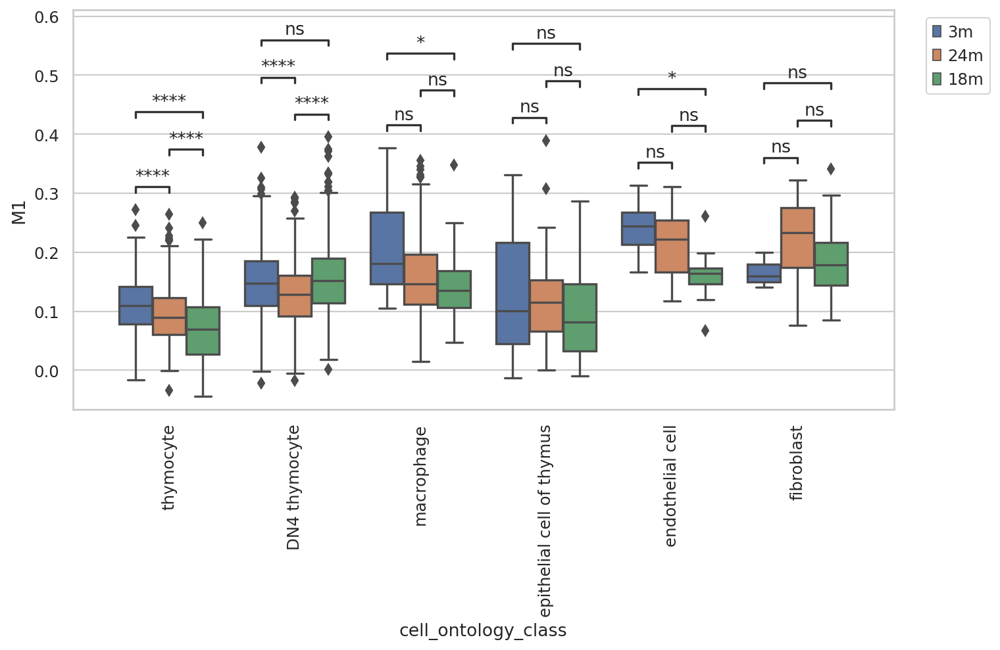

In [112]:
df = tissue_M[['age','cell_ontology_class','M1']]

x = "cell_ontology_class" 
y = "M1" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### M2 score_genes

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.646e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.449e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.492e-05 U_stat=1.444e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.202e-01 U_stat=1.760e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.821e-01 U_stat=1.010e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

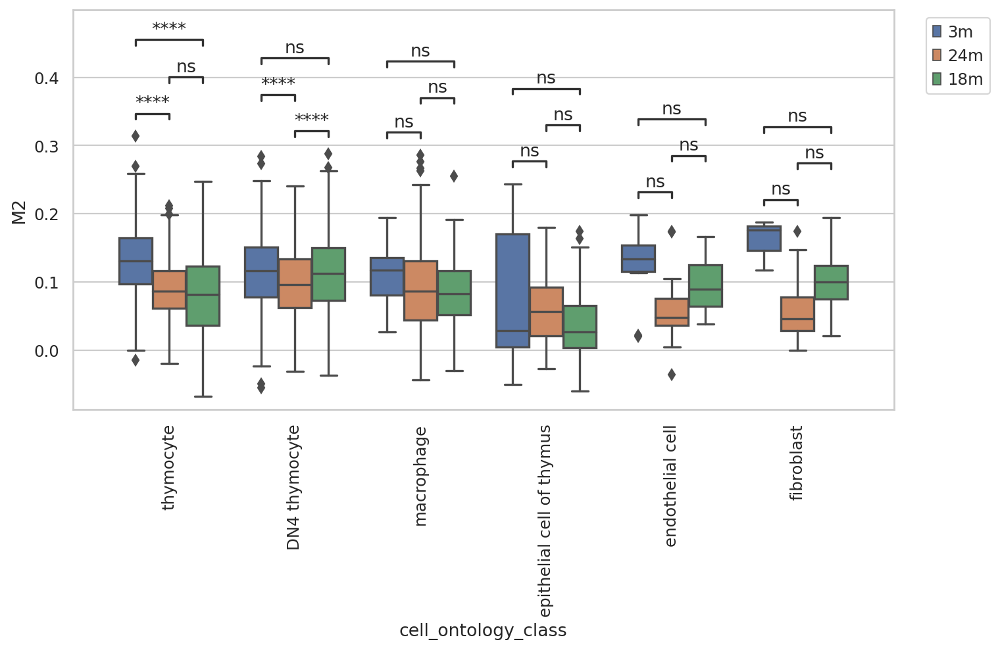

In [113]:
df = tissue_M[['age','cell_ontology_class','M2']]

x = "cell_ontology_class" 
y = "M2" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### IFN score_genes

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.833e-02 U_stat=3.071e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.025e-08 U_stat=8.586e+03
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.108e-14 U_stat=1.261e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.713e-02 U_stat=2.950e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

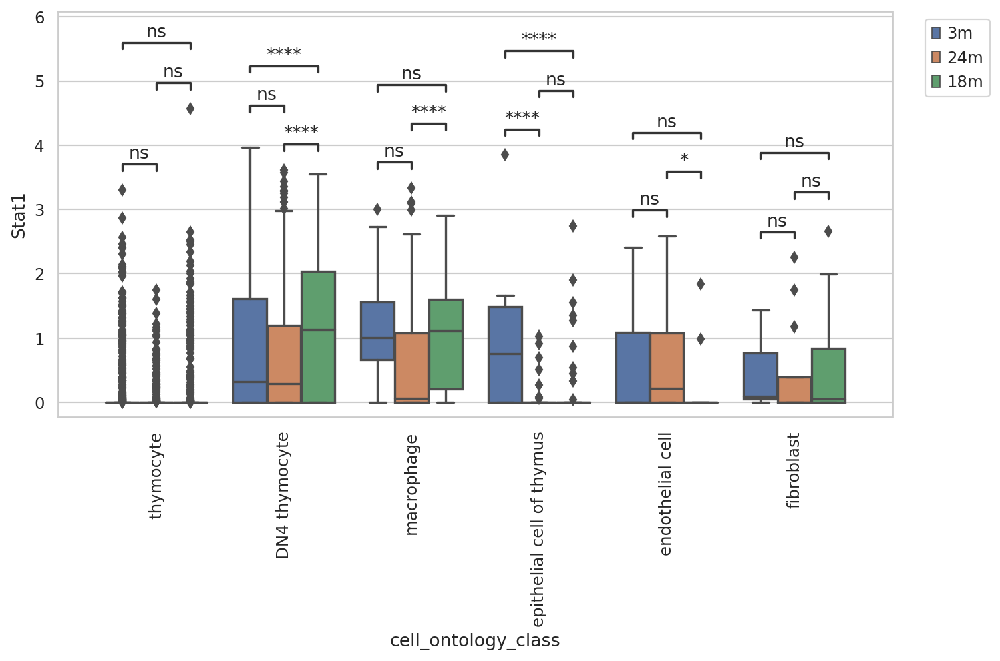

In [114]:
df = tissueIFN[['age','cell_ontology_class','Stat1']]

x = "cell_ontology_class" 
y = "Stat1" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### Ifnar2 gene

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.797e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.915e-02 U_stat=1.617e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.740e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.200e+01
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.690e+02
epithelial cell of thymus_3m v.s. epithelial cell of thymus_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'thymocyte'),
  Text(1, 0, 'DN4 thymocyte'),
  Text(2, 0, 'macrophage'),
  Text(3, 0, 'epithelial cell of thymus'),
  Text(4, 0, 'endothelial cell'),
  Text(5, 0, 'fibroblast')])

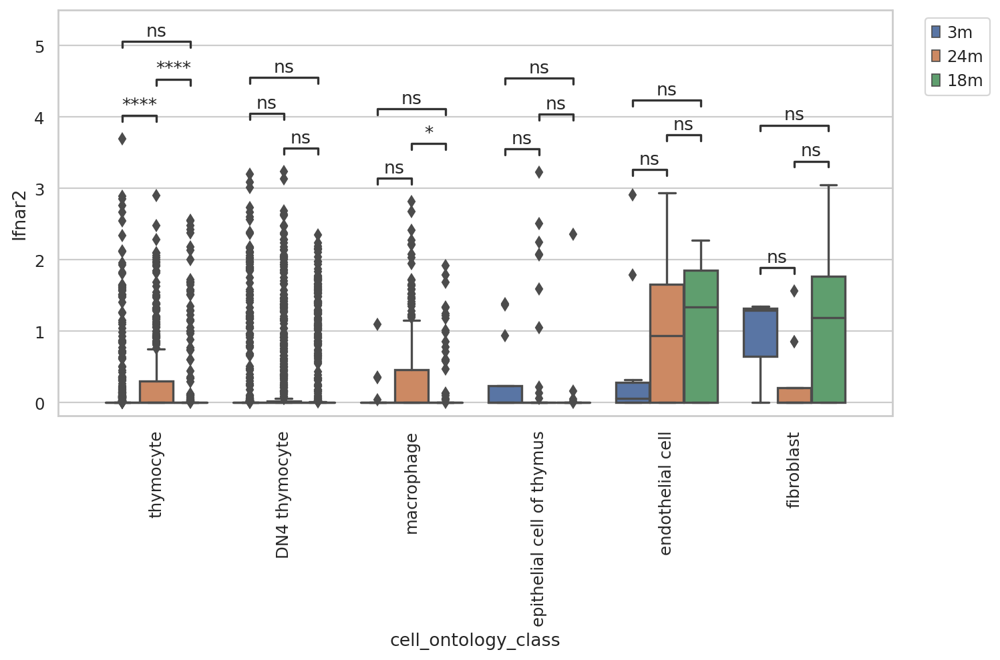

In [115]:
df = tissueIFN[['age','cell_ontology_class','Ifnar2']]

x = "cell_ontology_class" 
y = "Ifnar2" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)

plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)

#### Cd38 gene

Zero inflated distribution

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

macrophage_3m v.s. macrophage_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.612e-01 U_stat=1.583e+03
macrophage_24m v.s. macrophage_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.181e-02 U_stat=1.117e+04
DN4 thymocyte_24m v.s. DN4 thymocyte_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.688e+05
endothelial cell_3m v.s. endothelial cell_24m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.938e-01 U_stat=1.760e+02
endothelial cell_24m v.s. endothelial cell_18m: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.030e+02


ValueError: All numbers are identical in mannwhitneyu

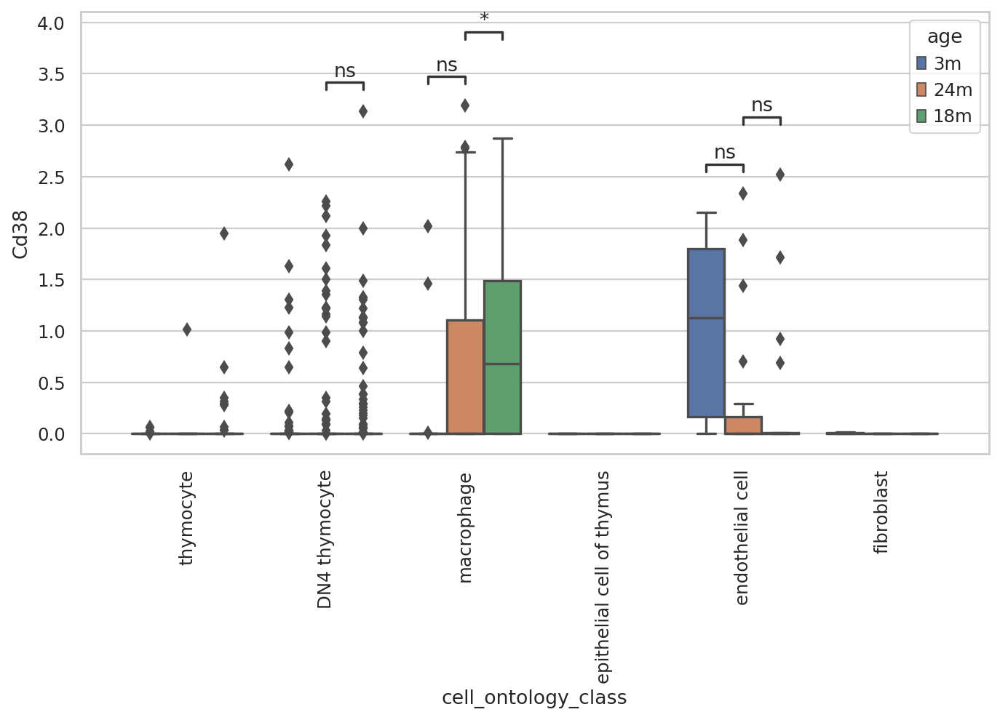

In [116]:
df = tissueIFN[['age','cell_ontology_class','Cd38']]

x = "cell_ontology_class" 
y = "Cd38" 
hue = 'age'
hue_order = ['3m', '18m', '24m']

box_pairs=[
    (("macrophage", "3m"), ("macrophage", "18m")),
    (("macrophage", "3m"), ("macrophage", "24m")),
    (("macrophage", "18m"), ("macrophage", "24m")),
    
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "18m")),
    (("DN4 thymocyte", "3m"), ("DN4 thymocyte", "24m")),
    (("DN4 thymocyte", "18m"), ("DN4 thymocyte", "24m")),
    
    (("endothelial cell", "3m"), ("endothelial cell", "18m")),
    (("endothelial cell", "3m"), ("endothelial cell", "24m")),
    (("endothelial cell", "18m"), ("endothelial cell", "24m")),
    
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "18m")),
    (("epithelial cell of thymus", "3m"), ("epithelial cell of thymus", "24m")),
    (("epithelial cell of thymus", "18m"), ("epithelial cell of thymus", "24m")),
    
    (("fibroblast", "3m"), ("fibroblast", "18m")),
    (("fibroblast", "3m"), ("fibroblast", "24m")),
    (("fibroblast", "18m"), ("fibroblast", "24m")),
    
    (("thymocyte", "3m"), ("thymocyte", "18m")),
    (("thymocyte", "3m"), ("thymocyte", "24m")),
    (("thymocyte", "18m"), ("thymocyte", "24m")),
    ]
fig = plt.figure(figsize=(10, 5))
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
plt.xticks(rotation=90)
ax = sns.boxplot(data=df, x=x, y=y, hue=hue)
add_stat_annotation(ax, data=df, x=x, y=y,hue=hue,box_pairs=box_pairs,
                    test='Mann-Whitney',loc='inside',verbose=2)